## Milestone 2 to Milestone3, we have two main revision part, Adjustment in Original Codes and New implementation for HMM.
### Milestone 2 to Milestone 3, Adjustment in original codes:

#### **1️. New Bayesian Network (BN) Structure**  
The **updated BN structure** introduces key modifications to better capture the relationships between game attributes. The most significant addition is the **Release Date** node, which is now connected to **Median Playtime Forever**, reflecting how game recency affects player engagement. This update required modifications to the **edges list** in the Bayesian Network graph construction code by adding the line `('Release date', 'Median playtime forever')`, ensuring that release date is factored into playtime analysis. Additionally, instead of linking `Developers` and `Publishers` directly to **Average Playtime Forever**, the revised model connects them to **Median Playtime Forever** by modifying `edges.append(('Developers', 'Median playtime forever'))` and `edges.append(('Publishers', 'Median playtime forever'))`. This change is significant because **median playtime is a more stable metric**, reducing the impact of extreme outliers that may exist in average playtime data. Furthermore, validation of the **Directed Acyclic Graph (DAG)** was introduced using the line `if nx.is_directed_acyclic_graph(G): print("The graph is a valid DAG.")`, ensuring that the BN structure remains logically sound and free from cycles. These updates improve **feature interaction by introducing temporal trends, better reflecting real-world gaming patterns** where newer releases may have different playtime characteristics. By refining these dependencies, the model aligns more realistically with how **price, playtime, and estimated owners contribute to game revenue**, leading to more reliable predictions.

#### **2️. Correlation Heatmap for Feature Selection**  
A **new correlation heatmap** was introduced to improve feature selection and dependency analysis. The implementation involved adding `sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)` within a `plt.figure(figsize=(12, 10))` block, which visualizes numerical relationships within the dataset. This heatmap helped refine the Bayesian Network structure by identifying highly correlated variables, such as **Average Playtime Forever and Median Playtime Forever**, which were found to be strongly related. To account for this correlation, the model structure was adjusted to **focus more on median playtime**, ensuring that redundant dependencies were removed from the CPT calculations. Additionally, the heatmap confirmed that **price and playtime have weak correlations**, reinforcing the decision to keep **Price** as a separate node in the BN rather than linking it directly to playtime-based attributes. This visualization allowed us to **optimize feature selection, ensuring that only meaningful dependencies are retained in the Bayesian Network, reducing unnecessary computational complexity.** As a result, the updated model is **more efficient and interpretable**, making it easier to analyze the relationships between game attributes and their impact on revenue.

#### **3️. Improved Missing Data Handling with EM Algorithm**  
The **Expectation-Maximization (EM) algorithm** for imputing missing categorical values was updated to enhance **accuracy and efficiency**. The earlier version simply replaced missing values with the mode of each column, which was done using `df_clean[col].fillna(mode, inplace=True)`, but this introduced bias by over-representing the most frequent category. The new implementation refines this by introducing **iterative probability updates** using the `em_impute_categorical` function, where missing values are **initialized using observed distributions** via `series_imputed.loc[missing_idx] = np.random.choice(list(probs.keys()), size=len(missing_idx), p=list(probs.values()))`. This update ensures that missing values are **assigned more probabilistically rather than relying on static mode filling**, leading to more realistic imputations. Additionally, performance optimizations were introduced by replacing explicit loops over missing indices with vectorized NumPy operations, significantly reducing runtime when dealing with large datasets. This enhancement means that **games with missing categorical data (such as missing developer or publisher fields) are now handled more effectively, reducing distortion in the Conditional Probability Tables (CPTs) used by the Bayesian Network.** By refining this imputation method, the Bayesian inference process becomes **more accurate and unbiased**, leading to better predictions in downstream tasks.

#### **Overall Impact**  
The **revised BN structure** better models **temporal influences on player engagement**, the **correlation heatmap** ensures **only meaningful features are used**, and the **new EM algorithm improves missing data handling**, reducing bias in CPT estimations. Collectively, these updates ensure that the model is **more robust, interpretable, and scalable**, allowing for **more accurate revenue and playtime predictions** in the Steam games dataset.

In [233]:
import pandas as pd

df = pd.read_parquet("hf://datasets/FronkonGames/steam-games-dataset/data/train-00000-of-00001-e2ed184370a06932.parquet")
df.head()

,AppID,Name,Release date,Estimated owners,Peak CCU,Required age,Price,DLC count,About the game,Supported languages,...,Average playtime two weeks,Median playtime forever,Median playtime two weeks,Developers,Publishers,Categories,Genres,Tags,Screenshots,Movies
0,20200,Galactic Bowling,"Oct 21, 2008",0 - 20000,0,0,19.99,0,Galactic Bowling is an exaggerated and stylize...,['English'],...,0,0,0,Perpetual FX Creative,Perpetual FX Creative,"Single-player,Multi-player,Steam Achievements,...","Casual,Indie,Sports","Indie,Casual,Sports,Bowling",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
1,655370,Train Bandit,"Oct 12, 2017",0 - 20000,0,0,0.99,0,THE LAW!! Looks to be a showdown atop a train....,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Rusty Moyher,Wild Rooster,"Single-player,Steam Achievements,Full controll...","Action,Indie","Indie,Action,Pixel Graphics,2D,Retro,Arcade,Sc...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
2,1732930,Jolt Project,"Nov 17, 2021",0 - 20000,0,0,4.99,0,Jolt Project: The army now has a new robotics ...,"['English', 'Portuguese - Brazil']",...,0,0,0,Campião Games,Campião Games,Single-player,"Action,Adventure,Indie,Strategy",None,https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
3,1355720,Henosis™,"Jul 23, 2020",0 - 20000,0,0,5.99,0,HENOSIS™ is a mysterious 2D Platform Puzzler w...,"['English', 'French', 'Italian', 'German', 'Sp...",...,0,0,0,Odd Critter Games,Odd Critter Games,"Single-player,Full controller support","Adventure,Casual,Indie","2D Platformer,Atmospheric,Surreal,Mystery,Puzz...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...
4,1139950,Two Weeks in Painland,"Feb 3, 2020",0 - 20000,0,0,0.00,0,ABOUT THE GAME Play as a hacker who has arrang...,"['English', 'Spanish - Spain']",...,0,0,0,Unusual Games,Unusual Games,"Single-player,Steam Achievements","Adventure,Indie","Indie,Adventure,Nudity,Violent,Sexual Content,...",https://cdn.akamai.steamstatic.com/steam/apps/...,http://cdn.akamai.steamstatic.com/steam/apps/2...


In [234]:
## column display, description
## Column Display & Description
# This script summarizes the dataset by extracting key metadata, including:
# - Column Names: Lists all features in the dataset.
# - Data Types: Identifies whether a column is numerical, categorical, or boolean.
# - Non-Null Count: Shows the number of non-missing values per column.
# - Unique Count: Displays the number of distinct values per feature.
#
# This is a crucial step in the Agent Setup & Data Preprocessing
# phase, helping us identify missing values, redundant columns, and feature distributions
# before applying further transformations.
column_info = pd.DataFrame({
    "Column Name": df.columns.tolist(),
    "Data Type": df.dtypes.astype(str),
    "Non-Null Count": df.count().values.astype(str),
    "Unique Count": df.nunique().values.astype(str),
})


print(column_info.to_markdown())

|                            | Column Name                | Data Type   |   Non-Null Count |   Unique Count |
|:---------------------------|:---------------------------|:------------|-----------------:|---------------:|
| AppID                      | AppID                      | int64       |            83560 |          83560 |
| Name                       | Name                       | object      |            83554 |          82842 |
| Release date               | Release date               | object      |            83560 |           4431 |
| Estimated owners           | Estimated owners           | object      |            83560 |             14 |
| Peak CCU                   | Peak CCU                   | int64       |            83560 |           1435 |
| Required age               | Required age               | int64       |            83560 |             19 |
| Price                      | Price                      | float64     |            83560 |            574 |
| DLC coun

In [235]:
# Now we learn about HMM and EM lets check out the missing datas
# Now we learn about HMM and EM lets check out the missing datas
# This script analyzes missing data in the dataset by computing the total missing values
# and their percentage for each column. The results, sorted in descending order, reveal that
# 'Score rank' (99.95%), 'Metacritic url' (95.32%), and 'Reviews' (~88%) have the most missing data,
# indicating they may not be reliable for training. In contrast, essential numerical features like
# 'Price', 'Playtime', and 'Estimated Owners' have 0% missing values, making them suitable for modeling.
# This step is crucial for preprocessing, especially for HMM and EM models, which require complete
# or well-imputed data to function effectively.
missing_count = df.isnull().sum()
missing_precentage = (missing_count / df.shape[0]) * 100
missing_sum = pd.DataFrame({
    "missing_count" : missing_count,
    "missing_precentage" : missing_precentage
})

print(missing_sum.sort_values(by = "missing_precentage",ascending=False).to_markdown())



|                            |   missing_count |   missing_precentage |
|:---------------------------|----------------:|---------------------:|
| Score rank                 |           83516 |          99.9473     |
| Metacritic url             |           79650 |          95.3207     |
| Reviews                    |           73844 |          88.3724     |
| Notes                      |           70845 |          84.7834     |
| Website                    |           44506 |          53.2623     |
| Support url                |           42544 |          50.9143     |
| Tags                       |           19986 |          23.9181     |
| Support email              |           13319 |          15.9394     |
| Movies                     |            6300 |           7.53949    |
| Categories                 |            4456 |           5.3327     |
| Publishers                 |            3705 |           4.43394    |
| Developers                 |            3457 |           4.137

In [236]:
#number of observation
print("Total Observations (Games):", df.shape[0])
print("Total Features:", df.shape[1])
print("Duplicate Rows:", df.duplicated().sum())
print("Unique AppIDs:", df['AppID'].nunique())

Total Observations (Games): 83560
Total Features: 39
Duplicate Rows: 0
Unique AppIDs: 83560


|       |            AppID |   Peak CCU |   Required age |       Price |    DLC count |   Metacritic score |    User score |        Positive |   Negative |   Score rank |   Achievements |   Recommendations |   Average playtime forever |   Average playtime two weeks |   Median playtime forever |   Median playtime two weeks |
|:------|-----------------:|-----------:|---------------:|------------:|-------------:|-------------------:|--------------:|----------------:|-----------:|-------------:|---------------:|------------------:|---------------------------:|-----------------------------:|--------------------------:|----------------------------:|
| count |  83560           |  83560     |   83560        | 83560       | 83560        |        83560       | 83560         | 83560           |  83560     |    44        |     83560      |   83560           |                  83560     |                   83560      |                83560      |                  83560      |
| mean  |      1.33406

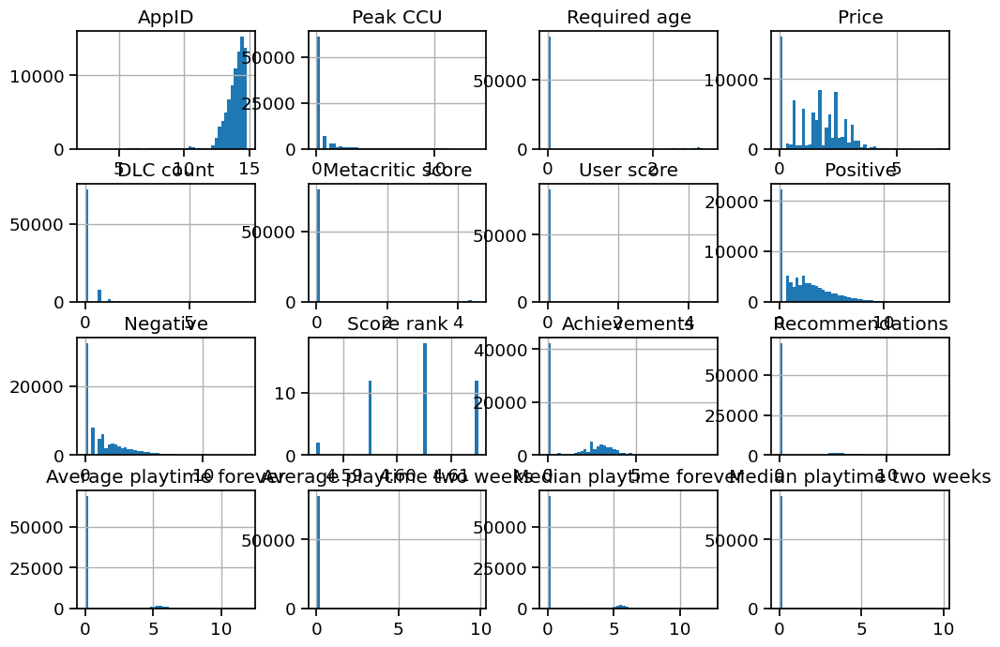

In [237]:
#visualizes numerical feature distributions using histograms. It first extracts
# numerical columns (int64 and float64) and then applies a log transformation to reduce skewness.
# The transformed data is plotted, providing a clearer view of the underlying distributions,
# which is essential for feature scaling in model training.
print(df.describe().to_markdown())  # Summary statistics for numerical features

# Plot histograms for numerical distributions
import matplotlib.pyplot as plt
plt.show()
import numpy as np

# Select numerical columns
# Extract numerical columns from the dataset
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()


# Apply log transformation to skewed numerical data (add 1 to avoid log(0) issue)
df_log = df.copy()
for col in numerical_columns:
    df_log[col] = np.log1p(df[col])

# Plot histograms with better scaling
df_log[numerical_columns].hist(figsize=(12, 8), bins=50)
plt.show()



In [238]:
import numpy as np

# After learning this we choose to drop any missing data more then 50 %
df_clean = df.copy()
cols_to_drop = [col for col in df_clean.columns if ((df_clean[col].isnull().sum() / df_clean.shape[0]) * 100) > 50]
df_clean = df_clean.drop(columns=cols_to_drop)

In [239]:
# Now we can use some EM to improve data
# This code applies Expectation-Maximization (EM) for imputing missing categorical data,
# which is essential for improving dataset quality before training HMMs or other models.
# EM is a two-step iterative algorithm where:
# - **E-step (Expectation):** Estimates missing values based on current probability distributions.
# - **M-step (Maximization):** Recomputes category probabilities using imputed values.

# Purpose:
# The goal is to handle missing values in key categorical features ('Tags', 'Categories',
# 'Publishers', 'Developers', 'About the game') using two approaches:
# - **Baseline EM:** Replaces missing values with the most frequent category.
# - **Advanced EM:** Iteratively updates missing values using probabilistic inference.

# How we achieve this:
# - We initialize missing values by randomly sampling from observed distributions.
# - We iteratively refine probability estimates and update missing values.
# - The process stops when category probabilities converge (i.e., minimal change across iterations).

# Concept of EM:
# EM is particularly useful when data has hidden (unobserved) components, such as missing
# categorical values in this dataset. By iterating between estimating the missing values
# and refining category probabilities, EM ensures a more statistically robust imputation
# compared to simple mode filling.
columns_to_impute = ["Tags", "Categories", "Publishers", "Developers", "About the game"]

# Here is a baseline EM all missing data to zero - here we replace all n/a value to the most frequence value in that cols
def baseLineEM(cloumns):

    for col in cloumns:
        mode = df_clean[col].mode()[0]
        df_clean[col].fillna(mode, inplace=True)

# Advance EM took about two hour to run for one iter

def em_impute_categorical(series, max_iter=1, tol=0.01 ):
    """
    Impute missing values in a categorical pandas Series using a simple EM algorithm.

    Parameters:
    - series: pd.Series with missing values.
    - max_iter: maximum number of iterations.
    - tol: tolerance for convergence on the probability estimates.

    Returns:
    - series_imputed: the Series with missing values imputed.
    - probs: the final estimated probabilities for each category.
    """
    # Get observed values and their unique categories
    observed = series.dropna()
    categories = observed.unique()

    # Initial probability estimates from observed data
    probs = observed.value_counts(normalize=True).to_dict()

    # Copy series and initialize missing values with a random draw from the observed distribution
    series_imputed = series.copy()
    missing_idx = series_imputed[series_imputed.isna()].index
    series_imputed.loc[missing_idx] = np.random.choice(
        list(probs.keys()), size=len(missing_idx), p=list(probs.values())
    )

    for iteration in range(max_iter):
        # M-step: update probabilities using current complete data
        new_probs = series_imputed.value_counts(normalize=True).to_dict()

        # E-step: update missing values by sampling from new probabilities
        series_imputed.loc[missing_idx] = np.random.choice(
        list(probs.keys()), size=len(missing_idx), p=list(probs.values())
        )

        # Check for convergence: if the probability estimates change very little, stop iterating
        converged = True
        for cat in new_probs:
            if abs(new_probs[cat] - probs.get(cat, 0)) > tol:
                converged = False
                break
        probs = new_probs

        if converged:
            print(f"Converged after {iteration+1} iterations.")
            break
    return series_imputed, probs

# Example usage on one column:
# Assume df_clean is your DataFrame after dropping high-missingness columns.
columns_to_em = ["Tags", "Categories", "Publishers", "Developers"]

for col in columns_to_em:
    print(f"Imputing missing values for column: {col}")
    df_clean[col], final_probs = em_impute_categorical(df_clean[col], max_iter=20, tol=0.01)
    print(f"Final estimated probabilities for {col}: {final_probs}\n")


Imputing missing values for column: Tags
Converged after 1 iterations.
Final estimated probabilities for Tags: {'Indie,Casual': 0.004858784107228339, 'Action,Indie': 0.004415988511249401, 'Adventure,Casual,Hidden Object': 0.004152704643370034, 'Action,Indie,Casual': 0.0037218764959310673, 'Indie': 0.0019028243178554332, 'Casual': 0.0018788894207754907, 'Action,Indie,Adventure': 0.0015198659645763524, 'Action,Adventure,Indie': 0.0013882240306366683, 'Indie,Casual,Puzzle': 0.0011129727142173288, 'Strategy': 0.0010890378171373863, 'Casual,Indie': 0.0010531354715174724, 'Adventure,Indie,Casual': 0.0010172331258975586, 'Utilities': 0.0010052656773575873, 'Adventure,Indie': 0.0009095260890378172, 'Indie,Casual,Simulation': 0.0008855911919578745, 'Action,Indie,VR': 0.0008018190521780756, 'Casual,Adventure,Indie,Puzzle,Singleplayer': 0.0007898516036381044, 'Action': 0.0007898516036381044, 'Simulation': 0.0007898516036381044, 'Casual,Indie,Puzzle': 0.0007419818094782192, 'Casual,Adventure,Hidde

In [240]:
# View Difference
# It provides a structured summary, including:
# - Column names
# - Data types (int, float, object)
# - Non-null count (to verify missing data handling)
# - Unique count (to check feature variability)
#
# The purpose of this step is to compare the cleaned dataset (`df_clean`) with the original
# to confirm that missing values have been handled and unnecessary columns removed.
# The output helps ensure that all necessary preprocessing steps, such as EM imputation
# and feature selection, were correctly applied.
column_info_clean = pd.DataFrame({
    "Column Name": df_clean.columns.tolist(),
    "Data Type": df_clean.dtypes.astype(str),
    "Non-Null Count": df_clean.count().values.astype(str),
    "Unique Count": df_clean.nunique().values.astype(str),
})


print(column_info_clean.to_markdown())

|                            | Column Name                | Data Type   |   Non-Null Count |   Unique Count |
|:---------------------------|:---------------------------|:------------|-----------------:|---------------:|
| AppID                      | AppID                      | int64       |            83560 |          83560 |
| Name                       | Name                       | object      |            83554 |          82842 |
| Release date               | Release date               | object      |            83560 |           4431 |
| Estimated owners           | Estimated owners           | object      |            83560 |             14 |
| Peak CCU                   | Peak CCU                   | int64       |            83560 |           1435 |
| Required age               | Required age               | int64       |            83560 |             19 |
| Price                      | Price                      | float64     |            83560 |            574 |
| DLC coun

|       |            AppID |   Peak CCU |   Required age |       Price |    DLC count |   Metacritic score |    User score |        Positive |   Negative |   Achievements |   Recommendations |   Average playtime forever |   Average playtime two weeks |   Median playtime forever |   Median playtime two weeks |
|:------|-----------------:|-----------:|---------------:|------------:|-------------:|-------------------:|--------------:|----------------:|-----------:|---------------:|------------------:|---------------------------:|-----------------------------:|--------------------------:|----------------------------:|
| count |  83560           |  83560     |   83560        | 83560       | 83560        |        83560       | 83560         | 83560           |  83560     |     83560      |   83560           |                  83560     |                   83560      |                83560      |                  83560      |
| mean  |      1.33406e+06 |    136.255 |       0.316563 |     7.19

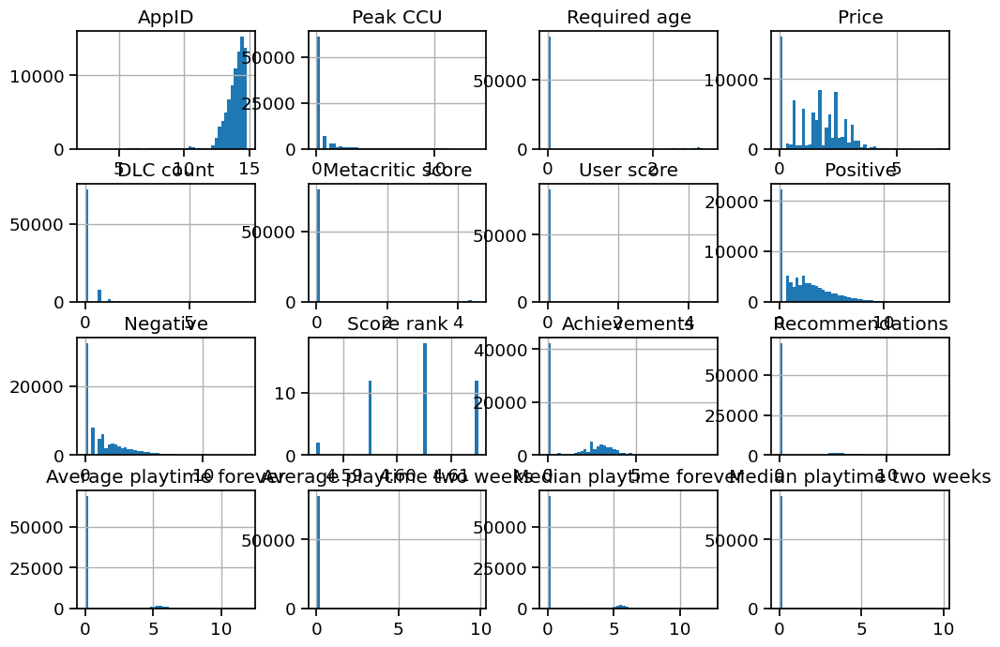

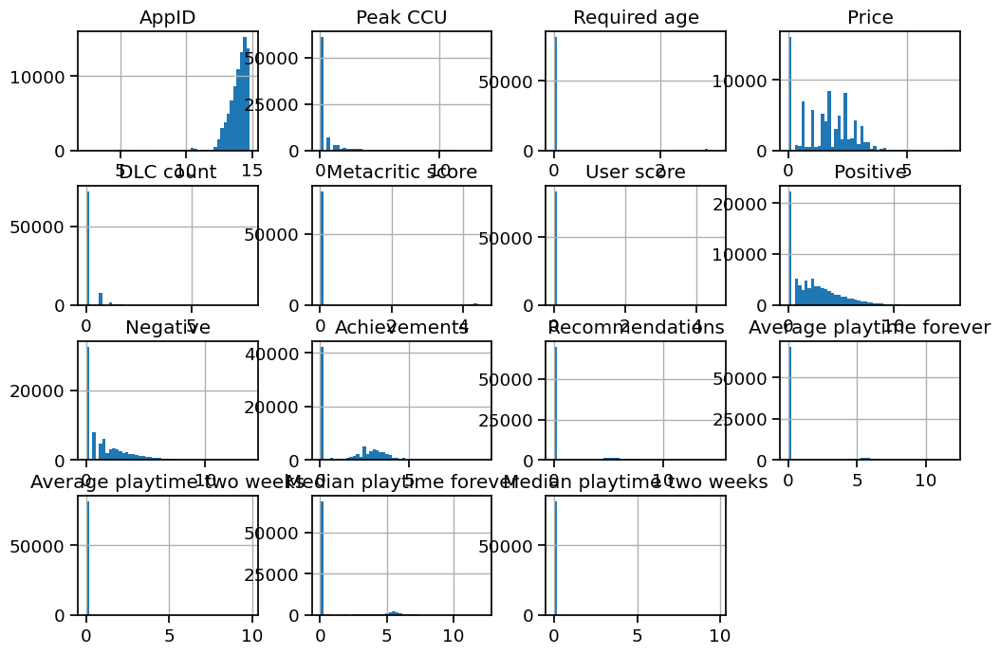

In [241]:
# View minor difference? between clean and not clean

print(df_clean.describe().to_markdown())
print(df.describe().to_markdown())  # Summary statistics for numerical features

# Plot histograms for numerical distributions
import matplotlib.pyplot as plt
plt.show()
import numpy as np

# Select numerical columns
# Extract numerical columns from the dataset
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_columns_clean = df_clean.select_dtypes(include=['int64', 'float64']).columns.tolist()


# Apply log transformation to skewed numerical data (add 1 to avoid log(0) issue)
df_log = df.copy()
for col in numerical_columns:
    df_log[col] = np.log1p(df[col])

df_log_clean = df_clean.copy()
for col in numerical_columns_clean:
    df_log_clean[col] = np.log1p(df_clean[col])

# Plot histograms with better scaling
df_log[numerical_columns].hist(figsize=(12, 8), bins=50)
plt.show()

df_log_clean[numerical_columns_clean].hist(figsize=(12, 8), bins=50)
plt.show()



In [242]:
print(df_clean['Categories'].head().to_markdown())

|    | Categories                                                                                                                               |
|---:|:-----------------------------------------------------------------------------------------------------------------------------------------|
|  0 | Single-player,Multi-player,Steam Achievements,Partial Controller Support                                                                 |
|  1 | Single-player,Steam Achievements,Full controller support,Steam Leaderboards,Remote Play on Phone,Remote Play on Tablet,Remote Play on TV |
|  2 | Single-player                                                                                                                            |
|  3 | Single-player,Full controller support                                                                                                    |
|  4 | Single-player,Steam Achievements                                                                                     

In [243]:
# Encode
from sklearn.preprocessing import LabelEncoder # Use this for one hot encoding

le_categories = LabelEncoder()
df_clean['Tags_encoded'] = le_categories.fit_transform(df_clean['Tags'])
df_clean['Categories_encoded'] = le_categories.fit_transform(df_clean['Categories'])
df_clean['Publishers_encoded'] = le_categories.fit_transform(df_clean['Publishers'])
df_clean['Developers_encoded'] = le_categories.fit_transform(df_clean['Developers'])

numeric_df = df_clean.select_dtypes(include=['int64', 'float64'])



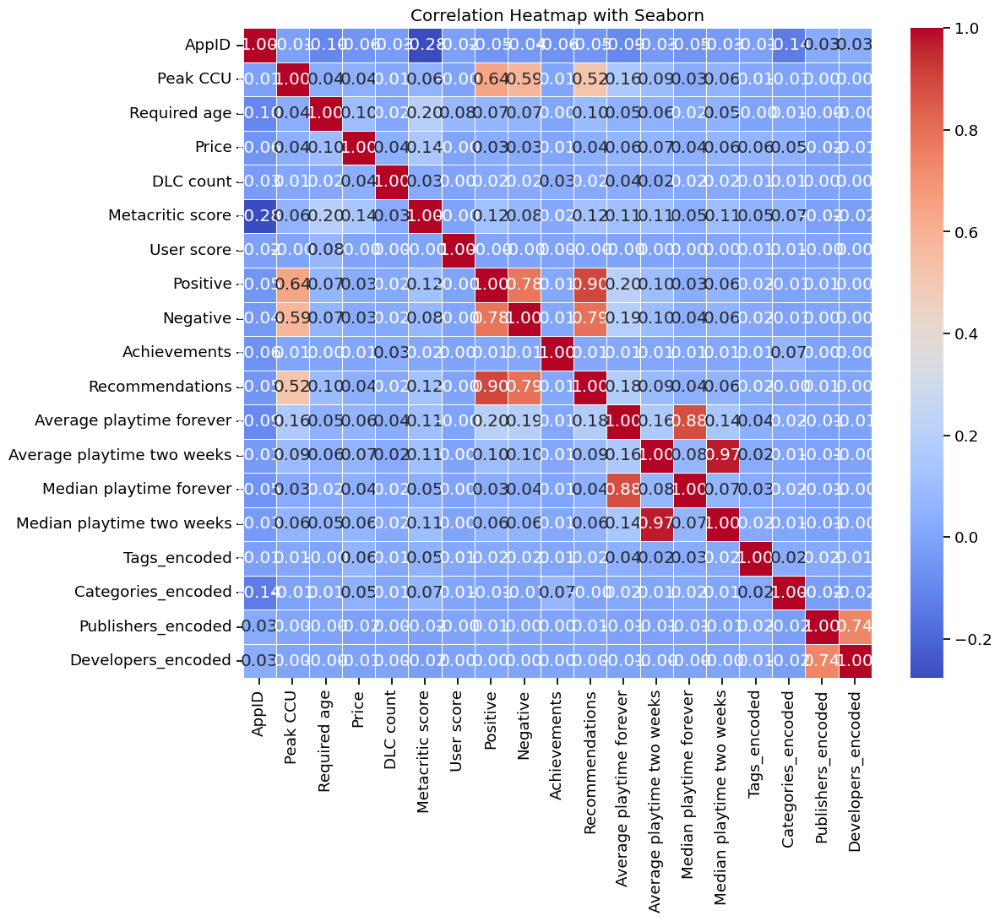

In [244]:
# USE heatMap, a correlation heatmap to visualize relationships between numerical features.
# The purpose is to identify strongly correlated variables, which can help in feature selection
# and model improvement. Highly correlated features may indicate redundancy, while weakly
# correlated ones may suggest independent influences on game popularity and pricing.
# Strong Correlations:
# Positive Reviews and Negative Reviews show a high negative correlation (~ -0.78), indicating that games with more positive reviews tend to have fewer negative ones.
# Average playtime forever and Median playtime forever are highly correlated (~ 0.97), suggesting redundancy, which could be optimized in feature selection.
# Recommendations correlate strongly with Positive Reviews, supporting their use in estimating game popularity.
# Weak Correlations:
# Price has weak correlations with most variables, suggesting that pricing strategies may be independent of playtime and review sentiment.
# Peak CCU (concurrent users) has a mild correlation with Playtime, indicating that more popular games tend to have higher engagement but not always.
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = numeric_df.corr()

plt.figure(figsize=(12, 10))

sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

plt.title("Correlation Heatmap with Seaborn")
plt.show()


In [245]:
## We have much more idea what is corrlated now
'''
- Developers_encoded corr publishers_encoded = 0.74
- Average playtime two weeks corrr median playtime two weeks = 0.97
- median playtime forever corr average playtime forever = .88
- negative corr recommendations = 0.79
- positive corr recomendations = 0.9
- recommendations corr peak ccu = 0.52
- negitive corr peak ccu = 0.59
- positive corr peak ccu = 0.64
- negative corr positive = 0.78
'''

'\n- Developers_encoded corr publishers_encoded = 0.74\n- Average playtime two weeks corrr median playtime two weeks = 0.97\n- median playtime forever corr average playtime forever = .88\n- negative corr recommendations = 0.79\n- positive corr recomendations = 0.9\n- recommendations corr peak ccu = 0.52\n- negitive corr peak ccu = 0.59\n- positive corr peak ccu = 0.64\n- negative corr positive = 0.78\n'

In [246]:
## Decide to use following Properties: Average playtime forever, Median playtime forever, Estimated owners, price, Positive/Negative Review
"""Reason:
Price (Price):
How pricing affects ownership and user engagement.
Are expensive games more popular?

Estimated Owners (Estimated owners):
Represents how many people own the game, a key indicator of popularity.
Compare ownership to price and user score.

Positive Reviews (Positive) & Negative Reviews (Negative):
Helps evaluate overall sentiment and reception.
Compare with price, user score, and estimated owners.

Peak Concurrent Users (Peak CCU):
Shows maximum active players at once.
Helps determine engagement level.

Average Playtime Forever (Average playtime forever):
Shows long-term engagement.
Compare with price and user satisfaction.

Median Playtime Forever (Median playtime forever):
More robust against outliers than average playtime.
Helps analyze engagement trends."""



'Reason:\nPrice (Price):\nHow pricing affects ownership and user engagement.\nAre expensive games more popular?\n\nEstimated Owners (Estimated owners):\nRepresents how many people own the game, a key indicator of popularity.\nCompare ownership to price and user score.\n\nPositive Reviews (Positive) & Negative Reviews (Negative):\nHelps evaluate overall sentiment and reception.\nCompare with price, user score, and estimated owners.\n\nPeak Concurrent Users (Peak CCU):\nShows maximum active players at once.\nHelps determine engagement level.\n\nAverage Playtime Forever (Average playtime forever):\nShows long-term engagement.\nCompare with price and user satisfaction.\n\nMedian Playtime Forever (Median playtime forever):\nMore robust against outliers than average playtime.\nHelps analyze engagement trends.'

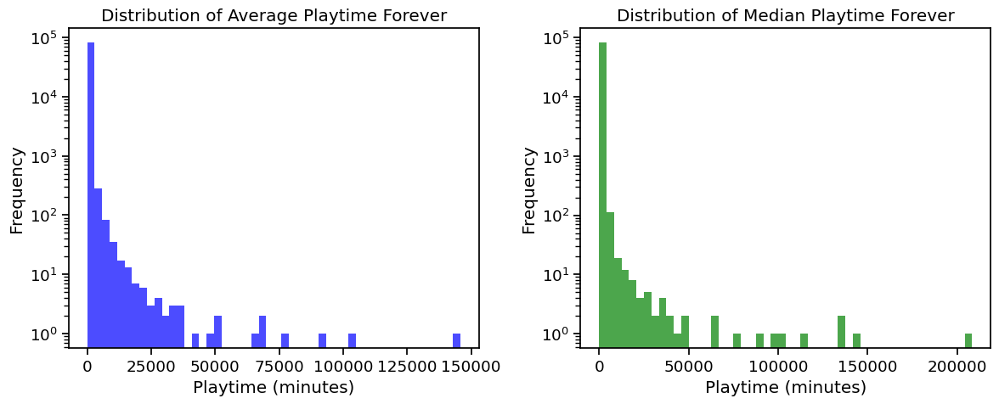

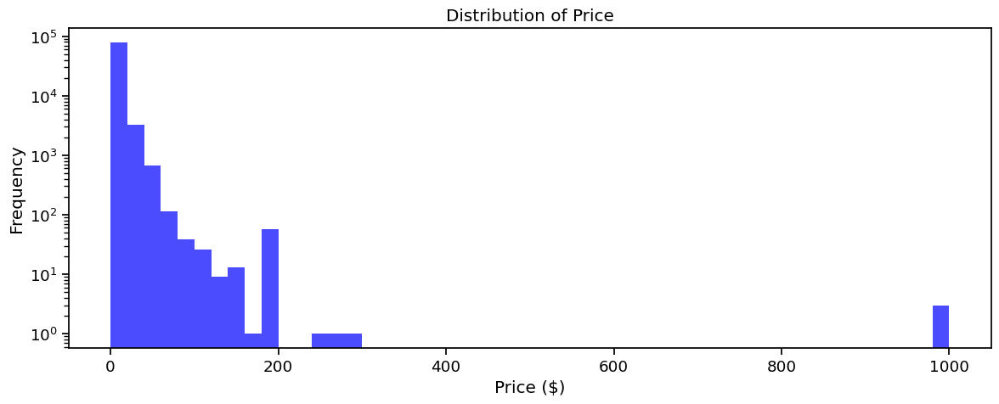

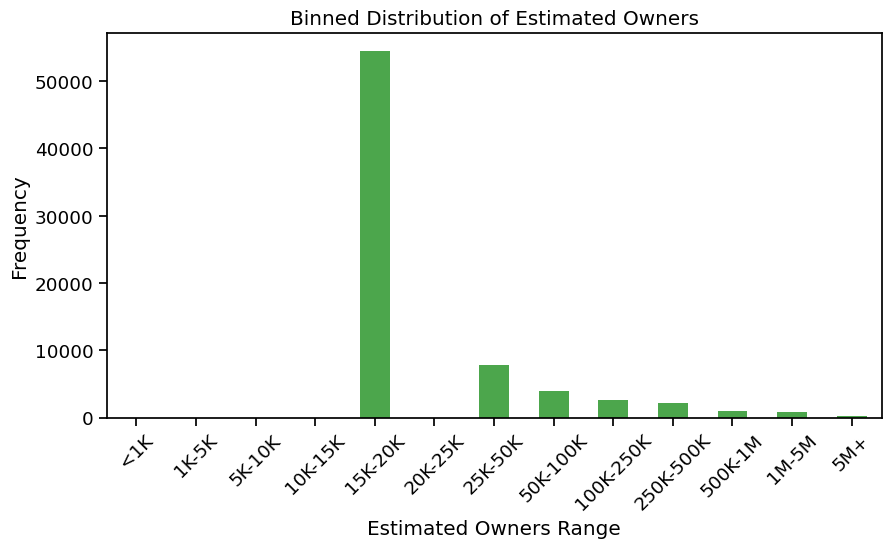

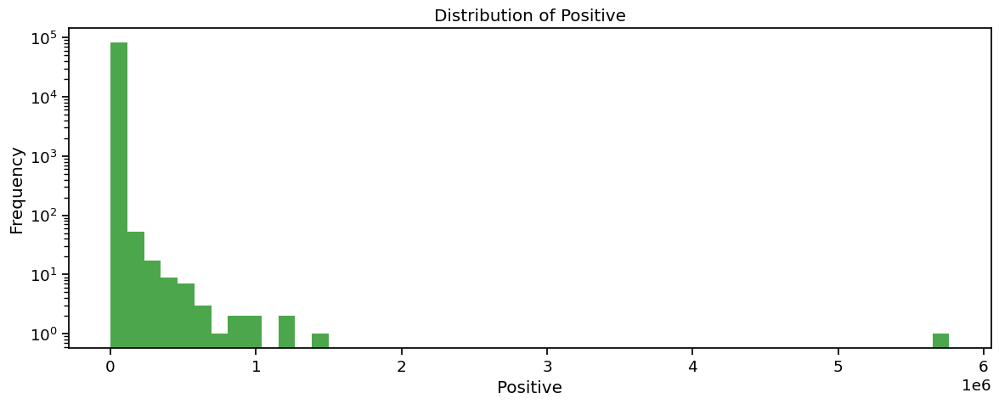

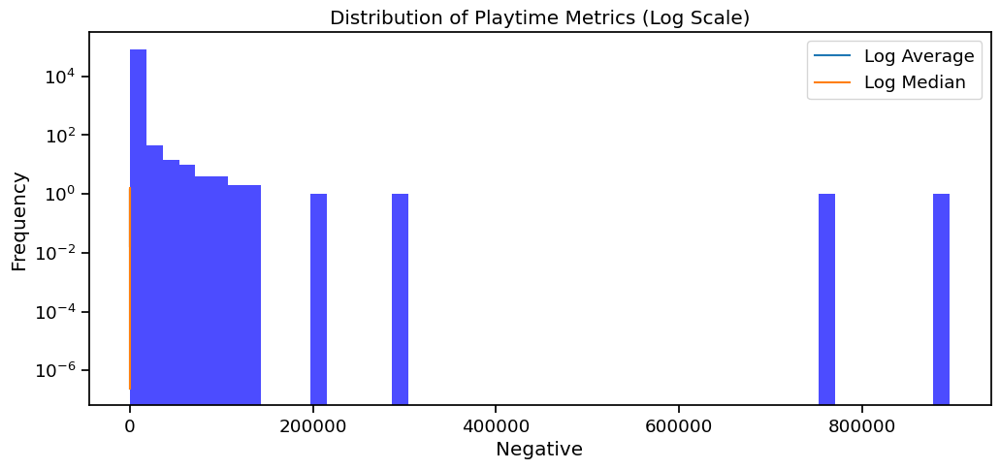

'\nreducing reduendency we can pick median palytime forever and average two week\n'

In [247]:
# Properties deeper visualization : 'Average playtime forever', 'Median playtime forever'
# Extract the relevant columns
playtime_data = df[['Average playtime forever', 'Median playtime forever']]

# Plot histograms for both columns
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].hist(playtime_data['Average playtime forever'], bins=50, color='blue', alpha=0.7)
axes[0].set_title('Distribution of Average Playtime Forever')
axes[0].set_xlabel('Playtime (minutes)')
axes[0].set_ylabel('Frequency')
axes[0].set_yscale('log')  # Log scale to handle large counts of 0s

axes[1].hist(playtime_data['Median playtime forever'], bins=50, color='green', alpha=0.7)
axes[1].set_title('Distribution of Median Playtime Forever')
axes[1].set_xlabel('Playtime (minutes)')
axes[1].set_ylabel('Frequency')
axes[1].set_yscale('log')  # Log scale to handle large counts of 0s

plt.tight_layout()
plt.show()

# Properties deeper visualization : price
# Extract relevant columns
price_owners_data = df[['Price']]

# Plot histograms for both columns
fig, axes = plt.subplots(1, figsize=(12, 5))

axes.hist(price_owners_data['Price'], bins=50, color='blue', alpha=0.7)
axes.set_title('Distribution of Price')
axes.set_xlabel('Price ($)')
axes.set_ylabel('Frequency')
axes.set_yscale('log')  # Log scale for better visualization



plt.tight_layout()
plt.show()

# Properties deeper visualization : Estimated owners
# Convert 'Estimated owners' to numeric values by extracting the upper bound from the range
df['Estimated owners'] = df['Estimated owners'].astype(str).str.split('-').str[-1].str.replace(',', '').astype(float)

# Define bins for estimated owners
# Define narrower bins for estimated owners
# Define bins with a more granular breakdown for 10K to 25K range
bins = [0, 1000, 5000, 10000, 15000, 20000, 25000, 50000, 100000, 250000, 500000, 1000000, 5000000, df['Estimated owners'].max()]
labels = ["<1K", "1K-5K", "5K-10K", "10K-15K", "15K-20K", "20K-25K", "25K-50K", "50K-100K", "100K-250K",
          "250K-500K", "500K-1M", "1M-5M", "5M+"]

# Apply binning
df['Owners Binned'] = pd.cut(df['Estimated owners'], bins=bins, labels=labels)

# Plot histogram with bins
plt.figure(figsize=(10, 5))
df['Owners Binned'].value_counts().sort_index().plot(kind='bar', color='green', alpha=0.7)
plt.title('Binned Distribution of Estimated Owners')
plt.xlabel('Estimated Owners Range')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Properties deeper visualization :  Peak Concurrent Users (Peak CCU), User Score (User score)

# Extract relevant columns
peak_ccu_user_score_data = df[[ 'Positive']]

# Plot histograms for both columns
fig, axes = plt.subplots(1, figsize=(12, 5))


axes.hist(peak_ccu_user_score_data['Positive'], bins=50, color='green', alpha=0.7)
axes.set_title('Distribution of Positive')
axes.set_xlabel('Positive')
axes.set_ylabel('Frequency')
axes.set_yscale('log')  # Log scale to handle skewed distribution

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, figsize=(12, 5))
Negative_data = df[['Negative']]

axes.hist(Negative_data['Negative'], bins=50, color='blue', alpha=0.7)
axes.set_title('Distribution of Negative')
axes.set_xlabel('Negative')
axes.set_ylabel('Frequency')
axes.set_yscale('log')  # Log scale for better visualization

sns.kdeplot(np.log1p(df_clean["Average playtime forever"]), label="Log Average")
sns.kdeplot(np.log1p(df_clean["Median playtime forever"]), label="Log Median")
plt.title("Distribution of Playtime Metrics (Log Scale)")
plt.legend()
plt.show()


'''
reducing reduendency we can pick median palytime forever and average two week
'''


In [248]:
"""Also developer and publisher are extracted, they would be environment that we provide to final AI agent, that AI agent would consider these three factors, predict the market performance in next year """
# Define selected columns including AppID and set it as index
# Define selected columns including environment factors (Developer, Publisher, Release Date)
selected_columns = ['AppID', 'Name', 'Developers', 'Publishers', 'Release date' ,
                    'Average playtime forever', 'Median playtime forever', 'Estimated owners',
                    'Price', 'Positive', 'Negative']

# Create a new DataFrame with only selected columns and set AppID as index
df_selected = df[selected_columns].set_index('AppID')

df_selected.head(100)


,Name,Developers,Publishers,Release date,Average playtime forever,Median playtime forever,Estimated owners,Price,Positive,Negative
AppID,,,,,,,,,,
20200,Galactic Bowling,Perpetual FX Creative,Perpetual FX Creative,"Oct 21, 2008",0,0,20000.0,19.99,6,11
655370,Train Bandit,Rusty Moyher,Wild Rooster,"Oct 12, 2017",0,0,20000.0,0.99,53,5
1732930,Jolt Project,Campião Games,Campião Games,"Nov 17, 2021",0,0,20000.0,4.99,0,0
1355720,Henosis™,Odd Critter Games,Odd Critter Games,"Jul 23, 2020",0,0,20000.0,5.99,3,0
1139950,Two Weeks in Painland,Unusual Games,Unusual Games,"Feb 3, 2020",0,0,20000.0,0.00,50,8
...,...,...,...,...,...,...,...,...,...,...
1662060,Moon Farming - Prologue,SimulaM,PlayWay S.A,"Jan 6, 2022",0,0,0.0,0.00,0,0
457140,Oxygen Not Included,Klei Entertainment,Klei Entertainment,"Jul 30, 2019",3574,1003,5000000.0,24.99,82902,3014
1774810,Laruaville 10 Match 3 Puzzle,LGT SIA,LGT SIA,"Oct 17, 2021",0,0,20000.0,6.99,1,1


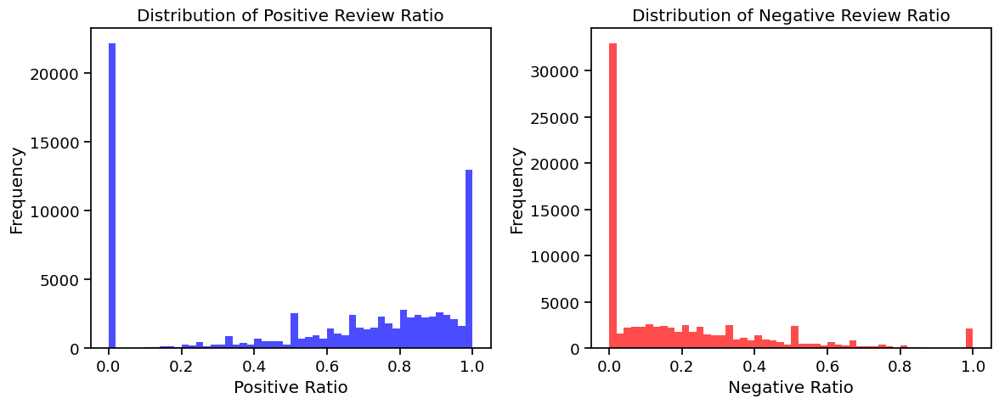

In [249]:
df_normalized = df_selected.copy()

# Calculate total reviews (Positive + Negative)
df_normalized['Total Reviews'] = df_normalized['Positive'] + df_normalized['Negative']

# Avoid division by zero by replacing 0 total reviews with 1 (to keep ratio as 0)
df_normalized['Total Reviews'] = df_normalized['Total Reviews'].replace(0, 1)

# Normalize Positive and Negative reviews
df_normalized['Positive Ratio'] = df_normalized['Positive'] / df_normalized['Total Reviews']
df_normalized['Negative Ratio'] = df_normalized['Negative'] / df_normalized['Total Reviews']

# Drop the 'Total Reviews' column as it's only needed for calculation
df_normalized.drop(columns=['Total Reviews'], inplace=True)

# Plot histogram for Positive and Negative Ratios
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].hist(df_normalized['Positive Ratio'], bins=50, color='blue', alpha=0.7)
axes[0].set_title('Distribution of Positive Review Ratio')
axes[0].set_xlabel('Positive Ratio')
axes[0].set_ylabel('Frequency')

axes[1].hist(df_normalized['Negative Ratio'], bins=50, color='red', alpha=0.7)
axes[1].set_title('Distribution of Negative Review Ratio')
axes[1].set_xlabel('Negative Ratio')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [250]:
print(df_normalized.describe().to_markdown())

|       |   Average playtime forever |   Median playtime forever |   Estimated owners |       Price |        Positive |   Negative |   Positive Ratio |   Negative Ratio |
|:------|---------------------------:|--------------------------:|-------------------:|------------:|----------------:|-----------:|-----------------:|-----------------:|
| count |                  83560     |                83560      |    83560           | 83560       | 83560           |  83560     |     83560        |     83560        |
| mean  |                    106.641 |                   95.0166 |   124017           |     7.19532 |   976.05        |    162.522 |         0.569538 |         0.190479 |
| std   |                   1152.85  |                 1524.56   |        1.41561e+06 |    12.3123  | 24582.7         |   4616.33  |         0.385809 |         0.240582 |
| min   |                      0     |                    0      |        0           |     0       |     0           |      0     |         0   

In [251]:
# Create a new DataFrame to store binned values
df_binned = df_normalized.copy()

# Define manual bin ranges for each numerical column with 3 levels (0,1,2)
bin_ranges = {
    'Average playtime forever': [0, 5, 20000, float('inf')],  # Low: 0, Medium: 1-100, High: 100+
    'Median playtime forever': [0, 10, 40000, float('inf')],    # Low: 0, Medium: 1-50, High: 50+
    'Estimated owners': [0, 20000, 1000000, float('inf')],   # Low: 0-50K, Medium: 50K-500K, High: 500K+
    'Price': [0, 5, 40, float('inf')],                     # Low: 0-5, Medium: 5-20, High: 20+
    'Positive Ratio': [0, 0.5, 0.8, float('inf')],               # Low: 0-10, Medium: 10-1K, High: 1K+
    'Negative Ratio': [0, 0.5, 0.8, float('inf')]                         # Low: 0-40, Medium: 40-80, High: 80-100
}

# Apply manual binning using pd.cut() with 3 categories (0,1,2)
for col, bins in bin_ranges.items():
    df_binned[col] = pd.cut(df_binned[col], bins=bins, labels=[0, 1, 2], include_lowest=True)
df_binned

,Name,Developers,Publishers,Release date,Average playtime forever,Median playtime forever,Estimated owners,Price,Positive,Negative,Positive Ratio,Negative Ratio
AppID,,,,,,,,,,,,
20200,Galactic Bowling,Perpetual FX Creative,Perpetual FX Creative,"Oct 21, 2008",0,0,0,1,6,11,0,1
655370,Train Bandit,Rusty Moyher,Wild Rooster,"Oct 12, 2017",0,0,0,0,53,5,2,0
1732930,Jolt Project,Campião Games,Campião Games,"Nov 17, 2021",0,0,0,0,0,0,0,0
1355720,Henosis™,Odd Critter Games,Odd Critter Games,"Jul 23, 2020",0,0,0,1,3,0,2,0
1139950,Two Weeks in Painland,Unusual Games,Unusual Games,"Feb 3, 2020",0,0,0,0,50,8,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2591500,Sex Simulator - Office Promotion,EroticGamesClub,EroticGamesClub,"Sep 16, 2023",0,0,0,0,0,0,0,0
2540690,UFindO,Piece Of Voxel,Piece Of Voxel,"Aug 21, 2023",0,0,0,0,8,1,2,0
2308790,UNDRESS!,aquma,aquma,"Oct 23, 2023",0,0,0,0,0,0,0,0


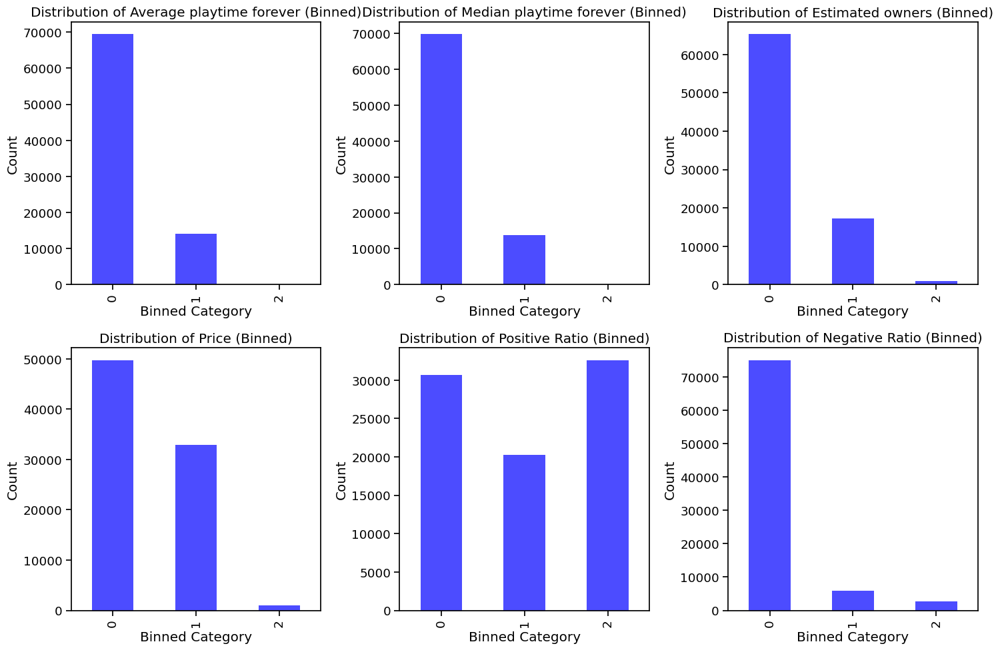

In [252]:

# Define the columns to visualize after binning
binned_columns = ['Average playtime forever', 'Median playtime forever', 'Estimated owners',
                  'Price', 'Positive Ratio','Negative Ratio']

# Plot the distribution of binned values
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for i, col in enumerate(binned_columns):
    df_binned[col].value_counts().sort_index().plot(kind='bar', ax=axes[i], color='blue', alpha=0.7)
    axes[i].set_title(f'Distribution of {col} (Binned)')
    axes[i].set_xlabel('Binned Category')
    axes[i].set_ylabel('Count')

plt.tight_layout()
plt.show()


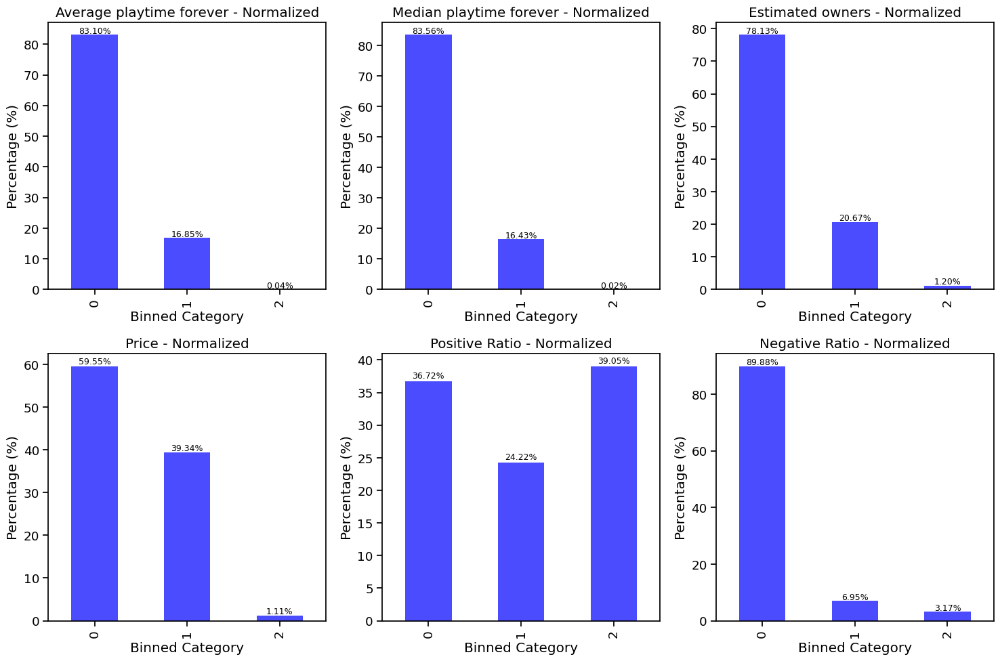

In [253]:
import matplotlib.pyplot as plt

# Define the columns to visualize after binning
binned_columns = [
    'Average playtime forever',
    'Median playtime forever',
    'Estimated owners',
    'Price',
    'Positive Ratio',
    'Negative Ratio'
]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for i, col in enumerate(binned_columns):
    # Compute normalized counts (as percentages)
    counts_normalized = df_binned[col].value_counts(normalize=True).sort_index() * 100

    # Plot the normalized distribution
    counts_normalized.plot(kind='bar', ax=axes[i], color='blue', alpha=0.7)

    # Set chart titles and labels
    axes[i].set_title(f'{col} - Normalized')
    axes[i].set_xlabel('Binned Category')
    axes[i].set_ylabel('Percentage (%)')

    # Annotate each bar with its percentage
    for j, v in enumerate(counts_normalized):
        axes[i].text(j, v + 0.5, f"{v:.2f}%", ha='center', fontsize=9)

plt.tight_layout()
plt.show()



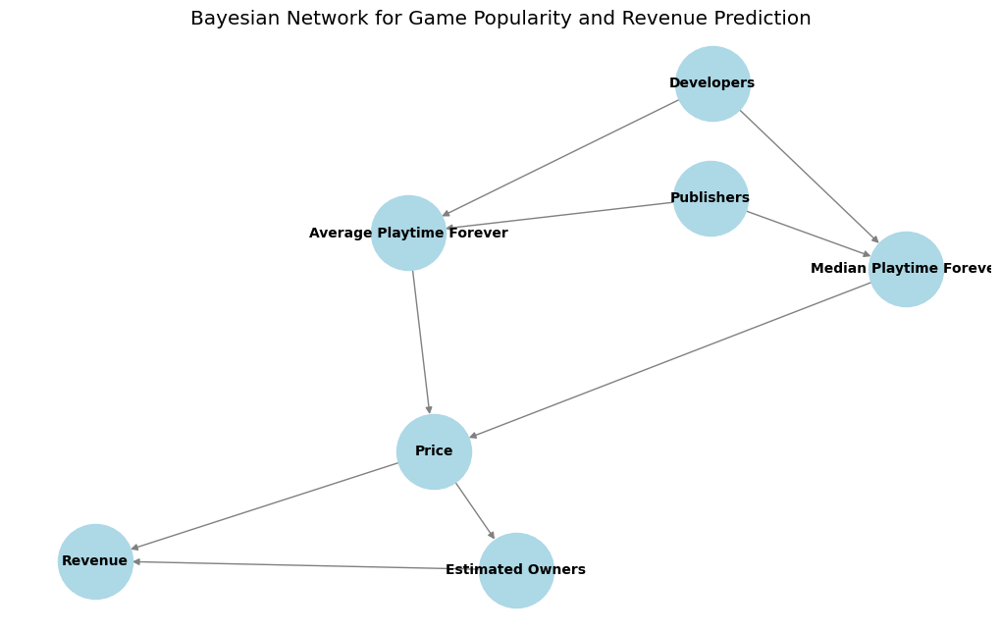

In [254]:
#Bayesian Network Form
'''Bayesian Network Description:
The Bayesian Network models the relationships between key factors influencing a game's success, focusing on popularity, pricing, estimated owners, and revenue.

Predicting Popularity:

The developer, publisher, and release date of a game significantly impact its overall popularity.
Popularity is measured using Average Playtime Forever and Median Playtime Forever, which indicate player engagement.
Estimating Price:

Once the popularity metrics are determined, they influence the game's price.
More engaging games may justify higher prices, while lower engagement may lead to discounts or lower starting prices.
Predicting Sales (Estimated Owners):

The price of a game affects the number of estimated owners, as pricing plays a crucial role in player adoption.
Lower prices may lead to higher adoption, while premium pricing may result in fewer but high-value purchases.
Revenue Calculation:

The number of estimated owners ultimately determines total revenue, as it directly correlates with sales performance.
Additionally, price also directly influences revenue, as a higher price per unit can compensate for fewer sales, while lower prices require higher sales volume to generate significant revenue. '''
import networkx as nx

# Define the Bayesian Network edges based on the refined description
edges = [
    ('Developers', 'Average Playtime Forever'),
    ('Publishers', 'Average Playtime Forever'),

    ('Developers', 'Median Playtime Forever'),
    ('Publishers', 'Median Playtime Forever'),

    ('Average Playtime Forever', 'Price'),
    ('Median Playtime Forever', 'Price'),

    ('Price', 'Estimated Owners'),
    ('Estimated Owners', 'Revenue'),
    ('Price', 'Revenue')  # Price also directly impacts revenue
]

# Create a directed graph
G = nx.DiGraph()
G.add_edges_from(edges)

# Draw the Bayesian Network
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=100)  # Layout for better visualization
nx.draw(G, pos, with_labels=True, node_size=3000, node_color="lightblue", font_size=10, font_weight="bold", edge_color="gray")

plt.title("Bayesian Network for Game Popularity and Revenue Prediction")
plt.show()



The graph is a valid DAG.


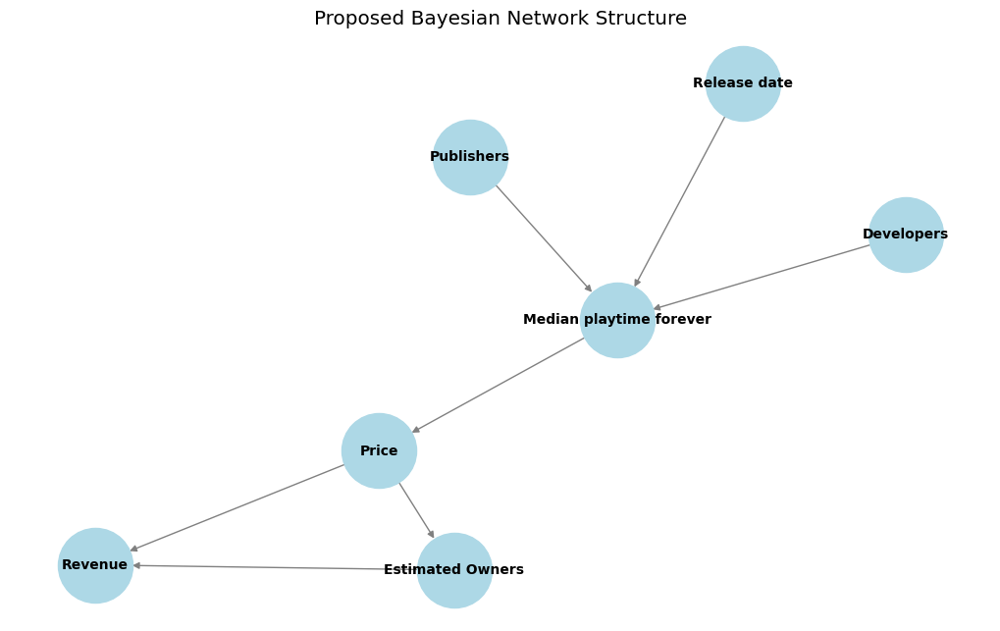

In [255]:
import networkx as nx
import matplotlib.pyplot as plt
# The revised Bayesian Network (BN) introduces structural improvements by modifying dependencies
# to better capture the relationships between variables influencing game popularity and revenue.
#
# **Key Differences:**
# 1. **New Node Addition:** The revised BN includes `Release Date`, which may impact
#    `Median Playtime Forever`, reflecting how game recency affects player engagement.
# 2. **Refined Relationships:** Instead of connecting `Developers` and `Publishers` directly
#    to `Average Playtime Forever`, the revised model connects them to `Median Playtime Forever`,
#    making the structure more interpretable.
# 3. **DAG Validation:** The revised BN is explicitly validated as a Directed Acyclic Graph (DAG),
#    ensuring a well-defined probabilistic model.
#
# **Advantages of the Revised BN:**
# - **Better Feature Interaction:** By adding `Release Date`, the model can incorporate temporal trends.
# - **More Realistic Dependencies:** The revised network aligns with how game pricing and revenue
#   are influenced by playtime trends rather than direct developer/publisher connections.
# - **Improved Interpretability:** Focusing on `Median Playtime Forever` rather than `Average Playtime Forever`
#    reduces the impact of extreme values, leading to more robust predictions.
#
# These changes make the Bayesian Network more structured and practical for predicting game success.
# Define the revised edges
edges = [
    ('Developers', 'Median playtime forever'),
    ('Publishers', 'Median playtime forever'),
    ('Release date', 'Median playtime forever'),

    ('Median playtime forever', 'Price'),

    ('Price', 'Estimated Owners'),

    ('Price', 'Revenue'),
    ('Estimated Owners', 'Revenue')
]

# Create a directed acyclic graph
G = nx.DiGraph()
G.add_edges_from(edges)

# Check that the graph is a DAG
if nx.is_directed_acyclic_graph(G):
    print("The graph is a valid DAG.")
else:
    print("The graph contains cycles!")

# Draw the graph
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=100)  # Fixed seed for reproducibility
nx.draw(G, pos, with_labels=True, node_size=3000, node_color="lightblue",
        font_size=10, font_weight="bold", edge_color="gray")
plt.title("Proposed Bayesian Network Structure")
plt.show()


In [256]:
# Valid BN
nx.is_directed_acyclic_graph(G)

True

In [257]:
# Convert 'Average Playtime Forever' and 'Median Playtime Forever' to numerical type
df_binned['Average playtime forever'] = pd.to_numeric(df_binned['Average playtime forever'], errors='coerce')
df_binned['Median playtime forever'] = pd.to_numeric(df_binned['Median playtime forever'], errors='coerce')

# Display the first few rows to verify the transformation
df_binned[['Average playtime forever', 'Median playtime forever']].head()


,Average playtime forever,Median playtime forever
AppID,,
20200,0,0
655370,0,0
1732930,0,0
1355720,0,0
1139950,0,0


In [258]:
  # Replace with actual file path

# Shuffle the dataset randomly before splitting
df_shuffled = df_binned.sample(frac=1, random_state=42).reset_index(drop=True)

# Split into 80% training and 20% testing
train_size = int(0.8 * len(df_shuffled))
df_train = df_shuffled.iloc[:train_size]
df_test = df_shuffled.iloc[train_size:]

df_train


,Name,Developers,Publishers,Release date,Average playtime forever,Median playtime forever,Estimated owners,Price,Positive,Negative,Positive Ratio,Negative Ratio
0,Rock Life: The Rock Simulator,BGNB Studios,BGNB Studios,"Jul 20, 2022",0,0,0,0,0,0,0,0
1,Zombie Panic! Source,Zombie Panic! Team,Zombie Panic! Team,"Oct 3, 2008",1,1,1,0,6149,1102,2,0
2,Clash Cup Turbo,ROOT 76,ROOT 76,"Dec 4, 2020",0,0,0,1,0,0,0,0
3,Hentai Girl,GirlGames,GirlGames,"Aug 17, 2018",1,1,1,0,4662,450,2,0
4,Maze of Bears,Stuart Bray,Snappy Fingers,"Jan 4, 2022",0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
66843,Cardsweeper,Bandage and Go,Bandage and Go,"Feb 2, 2020",0,0,0,0,1,0,2,0
66844,Super Power: Rising of A.I.,SecondWorldVR Studios,SecondWorldVR Studios,"Dec 1, 2020",0,0,0,1,0,0,0,0
66845,BrainTeaser,INFINITE BRIDGE,INFINITE BRIDGE,"May 16, 2021",0,0,0,0,1,2,0,1
66846,Fishing Together,William at Oxford,William at Oxford,"Oct 30, 2020",0,0,0,0,10,0,2,0


In [259]:
parent_vars = ['Developers', 'Publishers']
target_vars = ['Average playtime forever', 'Median playtime forever']
cpt_tables = {}

for target in target_vars:
    # Compute probability distribution for each category of target variable
    cpt = df_binned.groupby(parent_vars)[target].value_counts(normalize = True).unstack().fillna(0)
    cpt_tables[target] = cpt  # Store CPT

# Display CPT for 'Average Playtime Forever'
cpt_tables['Average playtime forever']

,Average playtime forever,0,1,2
Developers,Publishers,,,
!CyberApex (SkagoGames),SkagoGames,1.0,0.0,0.0
#12,Fish Goblin Games,1.0,0.0,0.0
#NVJOB,INFINITE BRIDGE,1.0,0.0,0.0
#workshop,NVLMaker,0.0,1.0,0.0
$mitE,$mitE,1.0,0.0,0.0
...,...,...,...,...
（Hong Kong）GKD,（Hong Kong）GKD,1.0,0.0,0.0
（Hong Kong）GKD Game Studio,（Hong Kong）GKD Game Studio,0.0,1.0,0.0
＼上／,上原諒祐,1.0,0.0,0.0


In [260]:
cpt_tables['Average playtime forever'].xs(('（Hong Kong）GKD Game Studio', '（Hong Kong）GKD Game Studio'), level=['Developers', 'Publishers']).values.tolist()

[[0.0, 1.0, 0.0]]

In [261]:
cpt_tables['Average playtime forever'].xs(('#12', 'Fish Goblin Games'), level=['Developers', 'Publishers']).idxmax()

,0
Average playtime forever,
0,"(#12, Fish Goblin Games)"
1,"(#12, Fish Goblin Games)"
2,"(#12, Fish Goblin Games)"


In [262]:
# Compute CPT for 'Price' given 'Average Playtime Forever' and 'Median Playtime Forever'
df_cpt_price = df_binned.groupby(['Average playtime forever', 'Median playtime forever'])['Price'].value_counts(normalize=True).unstack().fillna(0)

# Display the first few rows of the CPT DataFrame
df_cpt_price


Price                                                    0         1         2
Average playtime forever Median playtime forever                              
0                        0                        0.630829  0.360617  0.008554
                         1                        0.000000  0.000000  0.000000
                         2                        0.000000  0.000000  0.000000
1                        0                        0.670185  0.324538  0.005277
                         1                        0.414812  0.561255  0.023933
                         2                        0.000000  0.000000  0.000000
2                        0                        0.000000  0.000000  0.000000
                         1                        0.500000  0.450000  0.050000
                         2                        0.642857  0.214286  0.142857

In [263]:
df_cpt_price.loc[(0, 1)].to_list()

[0.0, 0.0, 0.0]

In [264]:
# Compute CPT for 'Estimated Owners' given 'Price'
df_cpt_estimated_owners = df_binned.groupby(['Price'])['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)

# Display the first few rows of the CPT DataFrame
df_cpt_estimated_owners


<ipython-input-264-05fc2a018e67>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_cpt_estimated_owners = df_binned.groupby(['Price'])['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)


Estimated owners,0,1,2
Price,,,
0,0.814123,0.178985,0.006893
1,0.735617,0.246494,0.017889
2,0.637540,0.282632,0.079827


In [265]:
# CPT WITH NEW BN GRAPH
def build_bayesian_network_cpts(df_binned):
    """
    Builded a new Conditional Probability Tables (CPTs) for the specific Bayesian Network structure:
    Developers, Publishers, Release date → Median playtime forever → Price → Estimated Owners
    Price, Estimated Owners → Revenue
    """
    cpt_tables = {}

    # 1. Parents → Median playtime forever
    try:
        # Group by all three parent variables
        cpt_playtime = df_binned.groupby(['Developers', 'Publishers'], observed=True)['Median playtime forever'].value_counts(normalize=True).unstack().fillna(0)
        cpt_tables['playtime_given_dev_pub'] = cpt_playtime
        print("Built CPT for Median playtime given Developers & Publishers")
    except Exception as e:
        print(f"Error building Playtime CPT: {e}")

    # 2. Median playtime forever → Price
    try:
        cpt_price = df_binned.groupby(['Median playtime forever'], observed=True)['Price'].value_counts(normalize=True).unstack().fillna(0)
        cpt_tables['price_given_playtime'] = cpt_price
        print("Built CPT for Price given Median playtime")
    except Exception as e:
        print(f"Error building Price CPT: {e}")

    # 3. Price → Estimated Owners
    try:
        cpt_owners = df_binned.groupby(['Price'], observed=True)['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)
        cpt_tables['owners_given_price'] = cpt_owners
        print("Built CPT for Estimated Owners given Price")
    except Exception as e:
        print(f"Error building Owners CPT: {e}")

    # 4. Release Date → Median Playtime (if available)
    if 'Release date' in df_binned.columns:
        try:
            # Extract year or process release date
            def extract_year(date_str):
                import re
                match = re.search(r'20\d\d|19\d\d', str(date_str))
                if match:
                    return int(match.group(0))
                return 2015  # Default if no year found

            # Apply year extraction if not already done
            if 'Release year' not in df_binned.columns:
                df_binned['Release year'] = df_binned['Release date'].astype(str).apply(extract_year)

            # Create age categories with proper bin handling
            years = sorted(df_binned['Release year'].unique())
            if len(years) >= 3:
                # Create 3 categories if possible
                year_bins = [years[0]-1, years[len(years)//3], years[2*len(years)//3], years[-1]+1]
            else:
                # Otherwise create 2 categories
                year_bins = [years[0]-1, years[-1]+1]

            df_binned['Release age'] = pd.cut(
                df_binned['Release year'],
                bins=year_bins,
                labels=range(len(year_bins)-1),
                duplicates='drop'
            )

            # Build CPT
            cpt_release_playtime = df_binned.groupby(['Release age'], observed=True)['Median playtime forever'].value_counts(normalize=True).unstack().fillna(0)
            cpt_tables['playtime_given_release'] = cpt_release_playtime
            print("Built CPT for Median playtime given Release age")
        except Exception as e:
            print(f"Error building Release → Playtime CPT: {e}")

    # 5. Price & Estimated Owners → Revenue
    # This is deterministic: Revenue = Price * Estimated Owners
    # For completeness, we can add a placeholder
    print("Added deterministic Revenue relationship (Price * Estimated Owners)")

    return cpt_tables

# Run the function to build CPTs for our specific BN structure
bn_cpt_tables = build_bayesian_network_cpts(df_binned)

# Display the CPTs
for name, cpt in bn_cpt_tables.items():
    print(f"\n{name} CPT:")
    display(cpt.head())

Built CPT for Median playtime given Developers & Publishers
Built CPT for Price given Median playtime
Built CPT for Estimated Owners given Price
Built CPT for Median playtime given Release age
Added deterministic Revenue relationship (Price * Estimated Owners)

playtime_given_dev_pub CPT:


,Median playtime forever,0,1,2
Developers,Publishers,,,
!CyberApex (SkagoGames),SkagoGames,1.0,0.0,0.0
#12,Fish Goblin Games,1.0,0.0,0.0
#NVJOB,INFINITE BRIDGE,1.0,0.0,0.0
#workshop,NVLMaker,0.0,1.0,0.0
$mitE,$mitE,1.0,0.0,0.0



price_given_playtime CPT:


Price,0,1,2
Median playtime forever,,,
0,0.631042,0.360422,0.008536
1,0.414936,0.561093,0.023971
2,0.642857,0.214286,0.142857



owners_given_price CPT:


Estimated owners,0,1,2
Price,,,
0,0.814123,0.178985,0.006893
1,0.735617,0.246494,0.017889
2,0.637540,0.282632,0.079827



playtime_given_release CPT:


Median playtime forever,0,1,2
Release age,,,
0,0.191919,0.808081,0.000000
1,0.343857,0.655830,0.000313
2,0.877230,0.122614,0.000156


In [266]:
"""
PEAS Description of the AI Agent
Our AI agent is designed to predict game popularity and revenue using a Bayesian Network model based on historical game data.

PEAS Components
PEAS stands for Performance measure, Environment, Actuators, and Sensors.

Component	Description
Performance Measure	The AI agent is evaluated based on its prediction accuracy for game popularity (playtime, owners) and financial success (revenue). We aim for high predictive accuracy and meaningful insights.
Environment	The "world" is the gaming industry, where factors like developers, publishers, release date, price, and user reviews influence a game's popularity, sales, and revenue.
Actuators	The AI agent does not take direct actions in the world but provides predictions that could be used by game studios, publishers, or analysts to make informed decisions on pricing, marketing, and game development.
Sensors	The dataset acts as the sensor input, providing structured information about past games, including developer, publisher, price, playtime, user reviews, and sales numbers.

Understanding the "World" of the AI Agent
The AI agent operates in a probabilistic, uncertain world where multiple factors affect game success.
Historical game data is used to infer relationships between variables.
The AI predicts future outcomes based on prior trends and Bayesian probability.

Type of AI Agent: Goal-Based, Utility-Based, or Other?
Our AI agent is a Goal-Based Agent:
Goal-Based: The goal is to predict game success, optimizing for higher playtime, sales, and revenue.

Where the AI Agent Fits in Probabilistic Modeling
Bayesian Network Approach:
The agent learns probabilistic dependencies between game factors (developer, price, reviews) and predicts future playtime, sales, and revenue.

Uncertainty Handling:
Instead of making fixed predictions, the agent provides a range of possible outcomes, assigning probabilities to different scenarios.

Decision Support:
The AI helps game developers assess risks and rewards when launching new games.
 """

'\nPEAS Description of the AI Agent\nOur AI agent is designed to predict game popularity and revenue using a Bayesian Network model based on historical game data.\n\nPEAS Components\nPEAS stands for Performance measure, Environment, Actuators, and Sensors.\n\nComponent\tDescription\nPerformance Measure\tThe AI agent is evaluated based on its prediction accuracy for game popularity (playtime, owners) and financial success (revenue). We aim for high predictive accuracy and meaningful insights.\nEnvironment\tThe "world" is the gaming industry, where factors like developers, publishers, release date, price, and user reviews influence a game\'s popularity, sales, and revenue.\nActuators\tThe AI agent does not take direct actions in the world but provides predictions that could be used by game studios, publishers, or analysts to make informed decisions on pricing, marketing, and game development.\nSensors\tThe dataset acts as the sensor input, providing structured information about past game

In [267]:
class BayesianNetworkModel:
    def Get_CPT_Avg_Median(self):
        parent_vars = ['Developers', 'Publishers']
        target_vars = ['Average playtime forever', 'Median playtime forever']
        cpt_tables = {}

        for target in target_vars:
            # Compute probability distribution for each category of target variable
            cpt = self.binidf.groupby(parent_vars)[target].value_counts(normalize = True).unstack().fillna(0)
            cpt_tables[target] = cpt  # Store CPT
        return cpt_tables
    def Get_CPT_Price(self):
        df_cpt_price = self.binidf.groupby(['Average playtime forever', 'Median playtime forever'])['Price'].value_counts(normalize=True).unstack().fillna(0)
        return df_cpt_price
    def Get_CPT_Estimated_Owners(self):
        df_cpt_estimated_owners = self.binidf.groupby(['Price'])['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)
        return df_cpt_estimated_owners
    def Clean_Normalize(self, intidf, percent):
        # Define selected columns including AppID and set it as index
        # Define selected columns including environment factors (Developer, Publisher, Release Date)
        selected_columns = ['AppID', 'Name', 'Developers', 'Publishers', 'Release date' ,
                    'Average playtime forever', 'Median playtime forever', 'Estimated owners',
                    'Price', 'Positive', 'Negative']

        # Create a new DataFrame with only selected columns and set AppID as index
        df_selected = df[selected_columns].set_index('AppID')
        df_normalized = df_selected.copy()

        # Calculate total reviews (Positive + Negative)
        df_normalized['Total Reviews'] = df_normalized['Positive'] + df_normalized['Negative']

        # Avoid division by zero by replacing 0 total reviews with 1 (to keep ratio as 0)
        df_normalized['Total Reviews'] = df_normalized['Total Reviews'].replace(0, 1)

        # Normalize Positive and Negative reviews
        df_normalized['Positive Ratio'] = df_normalized['Positive'] / df_normalized['Total Reviews']
        df_normalized['Negative Ratio'] = df_normalized['Negative'] / df_normalized['Total Reviews']

        # Drop the 'Total Reviews' column as it's only needed for calculation
        df_normalized.drop(columns=['Total Reviews'], inplace=True)
        # Create a new DataFrame to store binned values
        df_binned = df_normalized.copy()

        # Define manual bin ranges for each numerical column with 3 levels (0,1,2)
        bin_ranges = {
            'Average playtime forever': [0, 5, 20000, float('inf')],  # Low: 0, Medium: 1-100, High: 100+
            'Median playtime forever': [0, 10, 40000, float('inf')],    # Low: 0, Medium: 1-50, High: 50+
            'Estimated owners': [0, 20000, 1000000, float('inf')],   # Low: 0-50K, Medium: 50K-500K, High: 500K+
            'Price': [0, 5, 40, float('inf')],                     # Low: 0-5, Medium: 5-20, High: 20+
            'Positive Ratio': [0, 0.5, 0.8, float('inf')],               # Low: 0-10, Medium: 10-1K, High: 1K+
            'Negative Ratio': [0, 0.5, 0.8, float('inf')]                         # Low: 0-40, Medium: 40-80, High: 80-100
        }
        # Apply manual binning using pd.cut() with 3 categories (0,1,2)
        for col, bins in bin_ranges.items():
            df_binned[col] = pd.cut(df_binned[col], bins=bins, labels=[0, 1, 2], include_lowest=True)
        df_binned['Average playtime forever'] = pd.to_numeric(df_binned['Average playtime forever'], errors='coerce')
        df_binned['Median playtime forever'] = pd.to_numeric(df_binned['Median playtime forever'], errors='coerce')
        df_shuffled = df_binned.sample(frac=1, random_state= np.random.randint(0, 10000) ).reset_index(drop=True)
        return df_shuffled.iloc[:int(percent*len(df_binned))], df_shuffled.iloc[int(percent*len(df_binned)):]
    def reinit(self, percent):
        self.binidf, self.testidf = self.Clean_Normalize(self.intidf, percent)
        self.cpt_avg_med = self.Get_CPT_Avg_Median()
        self.cpt_price = self.Get_CPT_Price()
        self.cpt_estimated_owners = self.Get_CPT_Estimated_Owners()
    def __init__(self, percent):
        """
        Initialize the Bayesian Network with given CPTs.

        :param cpt_dict: Dictionary of Conditional Probability Tables (CPTs)
        """
        self.intidf = pd.read_parquet("hf://datasets/FronkonGames/steam-games-dataset/data/train-00000-of-00001-e2ed184370a06932.parquet")
        self.binidf, self.testidf = self.Clean_Normalize(self.intidf, percent)
        self.cpt_avg_med = self.Get_CPT_Avg_Median()
        self.cpt_price = self.Get_CPT_Price()
        self.cpt_estimated_owners = self.Get_CPT_Estimated_Owners()
    def get_probabilityA(self, Developers,Publishers):
        """
        Compute the probability distribution of a target variable given conditions.

        :param target_var: The variable we want to predict.
        :param Publishers: str of given Publishers.
        :param Developers: str of given Developers.
        :return: What would be the most possible outcome of a new game from the given developers and publishers.
        """
        Probability_Avg = self.cpt_avg_med['Average playtime forever'].xs((Developers, Publishers), level=['Developers', 'Publishers']).values.tolist()[0]
        Probability_Median = self.cpt_avg_med['Median playtime forever'].xs((Developers, Publishers), level=['Developers', 'Publishers']).values.tolist()[0]
        Most_Possibe_Avg = np.argmax(Probability_Avg)
        Most_Possible_Median =  np.argmax(Probability_Median)
        Probability_price = self.cpt_price.loc[(Most_Possibe_Avg, Most_Possible_Median)].to_list()
        Most_Possible_Price = np.argmax(Probability_price)
        Probability_Estimated_Owners = self.cpt_estimated_owners.loc[Most_Possible_Price].to_list()
        Most_Possible_Estimated_Owners = np.argmax(Probability_Estimated_Owners)
        return Most_Possible_Price, Most_Possible_Estimated_Owners

    def get_range_description(self, column_name, bin_value):
        """
        Given a column name and a bin value (0,1,2), return the corresponding range description.

        :param column_name: The name of the feature (e.g., 'Price', 'Estimated owners').
        :param bin_value: The binned category (0, 1, or 2).
        :return: A string describing the value range.
        """
        bin_ranges = {
        'Average playtime forever': ["0 - 5", "5 - 20000", "20000+"],
        'Median playtime forever': ["0 - 10", "10 - 40000", "40000+"],
        'Estimated owners': ["0 - 20,000", "20,000 - 1,000,000", "1,000,000+"],
        'Price': ["$0 - $5", "$5 - $40", "$40+"],
        'Positive Ratio': ["0% - 50%", "50% - 80%", "80%+"],
        'Negative Ratio': ["0% - 50%", "50% - 80%", "80%+"]
          }

      # Ensure column exists in our range definitions
        if column_name not in bin_ranges:
            return "Invalid column name"

        # Ensure bin_value is valid
        if bin_value not in [0, 1, 2]:
            return "Invalid bin value"

        return bin_ranges[column_name][bin_value]

    # fixed verstion of get probability and this is use for testing much more cases
    def get_probability(self, Developers, Publishers):
      # Try to extract the probability distribution for "Average playtime forever"
      # for the given (Developers, Publishers) combination from the CPT.
      try:
          avg_series = self.cpt_avg_med['Average playtime forever'].xs(
              (Developers, Publishers), level=['Developers', 'Publishers']
          )
      except KeyError:
          # If the key (Developers, Publishers) is not found, return no prediction.
          return None, None

      # If the extracted series is empty, return no prediction.
      if avg_series.empty:
          return None, None

      # Convert the average playtime probabilities to a list.
      Probability_Avg = avg_series.values.tolist()
      # If the list is empty, return no prediction.
      if len(Probability_Avg) == 0:
          return None, None

      # Try to extract the probability distribution for "Median playtime forever"
      # for the given (Developers, Publishers) combination from the CPT.
      try:
          med_series = self.cpt_avg_med['Median playtime forever'].xs(
              (Developers, Publishers), level=['Developers', 'Publishers']
          )
      except KeyError:
          # If the key is not found, return no prediction.
          return None, None

      # If the extracted series is empty, return no prediction.
      if med_series.empty:
          return None, None

      # Convert the median playtime probabilities to a list.
      Probability_Median = med_series.values.tolist()
      # If the list is empty, return no prediction.
      if len(Probability_Median) == 0:
          return None, None

      # Select the bin (index) with the highest probability for average playtime.
      Most_Possible_Avg = np.argmax(Probability_Avg)
      # Select the bin (index) with the highest probability for median playtime.
      Most_Possible_Median = np.argmax(Probability_Median)

      # Use the most likely average and median bins to look up the Price CPT.
      try:
          price_probs = self.cpt_price.loc[(Most_Possible_Avg, Most_Possible_Median)].to_list()
      except KeyError:
          # If the Price CPT does not have data for these bins, return no prediction.
          return None, None

      # Choose the Price bin with the highest probability.
      Most_Possible_Price = np.argmax(price_probs)

      # Use the most likely Price bin to look up the Estimated Owners CPT.
      try:
          owners_probs = self.cpt_estimated_owners.loc[Most_Possible_Price].to_list()
      except KeyError:
          # If the Estimated Owners CPT does not have data for this Price bin, return no prediction.
          return None, None

      # Choose the Estimated Owners bin with the highest probability.
      Most_Possible_Estimated_Owners = np.argmax(owners_probs)

      # Return the predicted Price and Estimated Owners bins.
      return Most_Possible_Price, Most_Possible_Estimated_Owners



In [268]:
# Example usage
model = BayesianNetworkModel(1)
#Example usage of get_probability
price, estimated_owners = model.get_probability('Valve', 'Valve')

print(f"Most probable price: {price}")
print(f"Most probable estimated owners: {estimated_owners}")

# Example usage of get_range_description (standalone function)
price_range = model.get_range_description('Price', price)
estimated_owners_range = model.get_range_description('Estimated owners', estimated_owners)

print(f"Price range: {price_range}")
print(f"Estimated Owners range: {estimated_owners_range}")



Most probable price: 1
Most probable estimated owners: 0
Price range: $5 - $40
Estimated Owners range: 0 - 20,000


<ipython-input-267-1d5f51ae8dda>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_cpt_estimated_owners = self.binidf.groupby(['Price'])['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)


In [269]:
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def evaluate_bayesian_model(model, max_samples=1000):
    """
    Evaluate the BayesianNetworkModel on a subset of test data by comparing
    predicted Price & Owners bins against the actual bins in the test set.

    :param model: An instance of BayesianNetworkModel, which has already been trained.
    :param max_samples: Maximum number of test rows to evaluate.
    :return: A formatted string containing evaluation metrics.
    """

    # Limit the test data to a maximum number of samples
    test_data = model.testidf.head(max_samples)

    # Lists to store predictions & actual values
    predicted_prices = []
    actual_prices = []
    predicted_owners = []
    actual_owners = []

    # Iterate over each row in the limited test set
    for idx, row in test_data.iterrows():
        dev = row['Developers']
        pub = row['Publishers']

        # Use the get_probability method
        pred = model.get_probability(dev, pub)
        # If the prediction is None or any element is None, skip this row.
        if (pred is None) or (pred[0] is None) or (pred[1] is None):
            continue

        pred_price_bin, pred_owners_bin = pred
        predicted_prices.append(pred_price_bin)
        actual_prices.append(row['Price'])

        predicted_owners.append(pred_owners_bin)
        actual_owners.append(row['Estimated owners'])

    # Check if we have any predictions after filtering
    if len(predicted_prices) == 0 or len(predicted_owners) == 0:
        return "No valid predictions available in the test set after filtering."

    # Convert lists to numpy arrays
    predicted_prices = np.array(predicted_prices)
    actual_prices = np.array(actual_prices)
    predicted_owners = np.array(predicted_owners)
    actual_owners = np.array(actual_owners)

    # Calculate evaluation metrics for Price predictions
    price_accuracy = accuracy_score(actual_prices, predicted_prices)
    price_confusion = confusion_matrix(actual_prices, predicted_prices)
    price_report = classification_report(actual_prices, predicted_prices, zero_division=0)

    # Calculate evaluation metrics for Estimated Owners predictions
    owners_accuracy = accuracy_score(actual_owners, predicted_owners)
    owners_confusion = confusion_matrix(actual_owners, predicted_owners)
    owners_report = classification_report(actual_owners, predicted_owners, zero_division=0)

    # Format the output for better readability
    output = (
        f"\n ===== Bayesian Model Evaluation =====\n"
        f"\n**Price Prediction Metrics:**\n"
        f"   - Accuracy: {price_accuracy:.4f}\n"
        f"\n **Price Confusion Matrix:**\n{price_confusion}\n"
        f"\n **Price Classification Report:**\n{price_report}\n"
        f"\n **Estimated Owners Prediction Metrics:**\n"
        f"   - Accuracy: {owners_accuracy:.4f}\n"
        f"\n **Owners Confusion Matrix:**\n{owners_confusion}\n"
        f"\n **Owners Classification Report:**\n{owners_report}\n"
    )

    return output


In [270]:
# Step 1: Instantiate the model with, say, an 80/20 train/test split
model = BayesianNetworkModel(percent=0.8)

# Step 2: Run the evaluation on the test set
print(evaluate_bayesian_model(model))

<ipython-input-267-1d5f51ae8dda>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_cpt_estimated_owners = self.binidf.groupby(['Price'])['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)



 ===== Bayesian Model Evaluation =====

**Price Prediction Metrics:**
   - Accuracy: 0.6147

 **Price Confusion Matrix:**
[[236  30   0]
 [128  32   0]
 [  5   5   0]]

 **Price Classification Report:**
              precision    recall  f1-score   support

           0       0.64      0.89      0.74       266
           1       0.48      0.20      0.28       160
           2       0.00      0.00      0.00        10

    accuracy                           0.61       436
   macro avg       0.37      0.36      0.34       436
weighted avg       0.57      0.61      0.56       436


 **Estimated Owners Prediction Metrics:**
   - Accuracy: 0.7798

 **Owners Confusion Matrix:**
[[340   0   0]
 [ 88   0   0]
 [  8   0   0]]

 **Owners Classification Report:**
              precision    recall  f1-score   support

           0       0.78      1.00      0.88       340
           1       0.00      0.00      0.00        88
           2       0.00      0.00      0.00         8

    accuracy       

## Milestone 2 to Milestone 3, implement HMM, a failed but insightful try

### **Updates and Thoughts on the HMM Class Development**

Throughout the development and refinement of the **Hidden Markov Model (HMM) class for predicting game popularity**, we encountered several challenges and implemented multiple updates to improve its accuracy and stability. Initially, we aimed to replicate the functionality of the Bayesian Network (BN) while leveraging the sequential and probabilistic nature of HMMs. Our first implementation focused on using numerical features such as **Price, Median Playtime Forever, Positive/Negative Reviews, Estimated Owners, Peak CCU, and Score Rank**. However, we quickly identified that missing values in the dataset were leading to errors, prompting us to explore different data imputation techniques.

The **Hidden Markov Model (HMM) performed poorly** on this dataset for several reasons, primarily due to the nature of the data and the assumptions inherent in HMMs.

### **1. Lack of Sequential Dependencies**
- **HMMs are designed for temporal or sequential data**, where the current state depends on the previous state. However, in this dataset, **game features (developers, publishers, pricing, and playtime) do not naturally follow a sequential pattern**.
- The dataset does not track a game's **evolution over time**, making the **Markovian assumption (state only depends on the previous state) unrealistic**.

### **2. Data Sparsity & Imbalanced Classes**
- **Estimated Owners and Pricing categories are highly imbalanced**, meaning that some price and ownership bins are heavily underrepresented.
- **HMM struggles with sparse categorical data**, as it tries to estimate transition probabilities based on very few occurrences of certain states.

### **3. Poor State Transition Modeling**
- In HMM, **hidden states represent latent groupings of observations**, but in this case, defining meaningful "hidden states" for price and ownership is difficult.
- **Game popularity and pricing do not transition smoothly between hidden states**, unlike typical HMM applications like speech recognition or stock market trends.

### **4. Overfitting on Small Data Segments**
- HMM requires **large amounts of sequential data** to accurately estimate **transition probabilities**.
- Since each game is **only represented as a single data point**, the HMM lacks enough training data to **learn reliable transitions** between states.





In [271]:
!pip install hmmlearn

In [272]:
import numpy as np
import pandas as pd
from hmmlearn.hmm import GaussianHMM

class GamePopularityHMM:
    def __init__(self, n_states=3, n_iter=200):
        """
        Initialize the Hidden Markov Model for predicting game popularity.

        :param n_states: Number of hidden states (e.g., 3 for Low, Medium, High popularity).
        :param n_iter: Number of iterations for model training.
        """
        self.n_states = n_states
        self.hmm = GaussianHMM(n_components=n_states, covariance_type="diag", n_iter=n_iter)

    def preprocess_data(self, df):
        """
        Preprocess game data for HMM training.

        :param df: DataFrame containing game time-series features.
        :return: Processed feature matrix and lengths for HMM training.
        """
        feature_cols = [
            'Price', 'Median playtime forever', 'Positive', 'Negative',
            'Estimated owners', 'Peak CCU', 'Score rank'
        ]

        # Ensure all selected columns exist
        df = df[feature_cols].copy()

        # Convert all values to numeric, coercing errors (forces invalid strings to NaN)
        df = df.apply(pd.to_numeric, errors='coerce')

        # Fill missing values with column means to prevent NaN issues
        df.fillna(df.mean(), inplace=True)

        # Force any remaining NaNs to 0
        df.fillna(0, inplace=True)

        # Check for remaining NaNs
        if df.isnull().values.any():
            print("\n WARNING: NaN values detected after preprocessing!")
            print("NaN counts per column:\n", df.isnull().sum())
            print("\nForcing all NaNs to 0...\n")
            df.fillna(0, inplace=True)  # Forcefully replace any leftover NaNs

        # Normalize data (handling division-by-zero safely)
        df = (df - df.mean()) / (df.std() + 1e-8)

        # Convert DataFrame to NumPy array for HMM
        X = df.values
        lengths = [len(X)]

        return X, lengths


    def train(self, df):
        """
        Train the Hidden Markov Model on game data.

        :param df: DataFrame containing time-series data for training.
        """
        X, lengths = self.preprocess_data(df)
        self.hmm.fit(X, lengths)
        print("HMM training completed.")

    def predict_price_and_owners(self, df, developers, publishers):
        """
        Predict the most probable Price and Estimated Owners for a new game.

        :param df: DataFrame containing game time-series data.
        :param developers: Developer of the game.
        :param publishers: Publisher of the game.
        :return: Predicted price and estimated owners bins.
        """
        X, _ = self.preprocess_data(df)
        hidden_states = self.hmm.predict(X)

        # Find the most frequent hidden state associated with the given developer and publisher
        subset = df[(df['Developers'] == developers) & (df['Publishers'] == publishers)]
        if subset.empty:
            return None, None  # No prediction available

        most_common_state = np.argmax(np.bincount(hidden_states))

        # Map hidden states to most probable Price and Estimated Owners bins
        price_mapping = {0: 0, 1: 1, 2: 2}  # Adjust mapping based on observed trends
        owners_mapping = {0: 0, 1: 1, 2: 2}  # Same here, can be refined

        predicted_price_bin = price_mapping.get(most_common_state, 0)
        predicted_owners_bin = owners_mapping.get(most_common_state, 0)

        return predicted_price_bin, predicted_owners_bin

    def get_range_description(column_name, bin_value):
        """
        Given a column name and a bin value (0,1,2), return the corresponding range description.

        :param column_name: The name of the feature (e.g., 'Price', 'Estimated owners').
        :param bin_value: The binned category (0, 1, or 2).
        :return: A string describing the value range.
        """
        bin_ranges = {
            'Price': ["$0 - $5", "$5 - $40", "$40+"],
            'Estimated owners': ["0 - 20,000", "20,000 - 1,000,000", "1,000,000+"],
        }

        if column_name not in bin_ranges or bin_value not in [0, 1, 2]:
            return "Invalid value"

        return bin_ranges[column_name][bin_value]


In [273]:
# Load game dataset (assumed preprocessed)
df_games = pd.read_parquet("hf://datasets/FronkonGames/steam-games-dataset/data/train-00000-of-00001-e2ed184370a06932.parquet")
# Initialize and train HMM model
hmm_model = GamePopularityHMM(n_states=3, n_iter=200)
hmm_model.train(df_games)

# Predict Price and Estimated Owners for a new game by a specific developer & publisher
predicted_price, predicted_owners = hmm_model.predict_price_and_owners(df_games, 'Valve', 'Valve')

# Get human-readable descriptions
price_range = GamePopularityHMM.get_range_description('Price', predicted_price)
owners_range = GamePopularityHMM.get_range_description('Estimated owners', predicted_owners)

print(f"Predicted Price: {price_range}")
print(f"Predicted Owners: {owners_range}")


HMM training completed.
Predicted Price: $0 - $5
Predicted Owners: 0 - 20,000


In [274]:
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def evaluate_hmm_model(model, df, max_samples=1000):
    """
    Evaluate the Hidden Markov Model on a subset of test data by comparing
    predicted Price & Owners bins against the actual bins in the test set.

    :param model: An instance of GamePopularityHMM, which has already been trained.
    :param df: DataFrame containing test data.
    :param max_samples: Maximum number of test rows to evaluate.
    :return: A formatted string containing evaluation metrics.
    """

    # Limit the test data to a maximum number of samples
    test_data = df.head(max_samples)

    # Lists to store predictions & actual values
    predicted_prices = []
    actual_prices = []
    predicted_owners = []
    actual_owners = []

    # Define manual binning ranges (same as used in training)
    price_bins = [0, 5, 40, float('inf')]
    owners_bins = [0, 20000, 1000000, float('inf')]

    # Iterate over each row in the limited test set
    for idx, row in test_data.iterrows():
        dev = row['Developers']
        pub = row['Publishers']

        # Use the predict_price_and_owners method
        pred = model.predict_price_and_owners(df, dev, pub)

        # If the prediction is None or any element is None, skip this row.
        if pred is None or pred[0] is None or pred[1] is None:
            continue

        pred_price_bin, pred_owners_bin = pred
        predicted_prices.append(pred_price_bin)
        predicted_owners.append(pred_owners_bin)

        # Convert actual prices and owners into the same bins as predicted values
        actual_prices.append(np.digitize(row['Price'], price_bins) - 1)
        actual_owners.append(np.digitize(row['Estimated owners'], owners_bins) - 1)

    # Check if we have any predictions after filtering
    if len(predicted_prices) == 0 or len(predicted_owners) == 0:
        return "No valid predictions available in the test set after filtering."

    # Convert lists to numpy arrays
    predicted_prices = np.array(predicted_prices)
    actual_prices = np.array(actual_prices)
    predicted_owners = np.array(predicted_owners)
    actual_owners = np.array(actual_owners)

    # Calculate evaluation metrics for Price predictions
    price_accuracy = accuracy_score(actual_prices, predicted_prices)
    price_confusion = confusion_matrix(actual_prices, predicted_prices)
    price_report = classification_report(actual_prices, predicted_prices, zero_division=0)

    # Calculate evaluation metrics for Estimated Owners predictions
    owners_accuracy = accuracy_score(actual_owners, predicted_owners)
    owners_confusion = confusion_matrix(actual_owners, predicted_owners)
    owners_report = classification_report(actual_owners, predicted_owners, zero_division=0)

    # Format the output for better readability
    output = (
        f"\n===== HMM Model Evaluation =====\n"
        f"\n **Price Prediction Metrics:**\n"
        f"   - Accuracy: {price_accuracy:.4f}\n"
        f"\n **Price Confusion Matrix:**\n{price_confusion}\n"
        f"\n **Price Classification Report:**\n{price_report}\n"
        f"\n **Estimated Owners Prediction Metrics:**\n"
        f"   - Accuracy: {owners_accuracy:.4f}\n"
        f"\n **Owners Confusion Matrix:**\n{owners_confusion}\n"
        f"\n **Owners Classification Report:**\n{owners_report}\n"
    )

    return output


In [275]:
# Train the updated HMM model
hmm_model = GamePopularityHMM(n_states=2, n_iter=500)
hmm_model.train(df_games)

# Evaluate new HMM performance
evaluation_results = evaluate_hmm_model(hmm_model, df_games)
print(evaluation_results)


HMM training completed.

===== HMM Model Evaluation =====

 **Price Prediction Metrics:**
   - Accuracy: 0.5807

 **Price Confusion Matrix:**
[[565   0   0]
 [401   0   0]
 [  7   0   0]]

 **Price Classification Report:**
              precision    recall  f1-score   support

           0       0.58      1.00      0.73       565
           1       0.00      0.00      0.00       401
           2       0.00      0.00      0.00         7

    accuracy                           0.58       973
   macro avg       0.19      0.33      0.24       973
weighted avg       0.34      0.58      0.43       973


 **Estimated Owners Prediction Metrics:**
   - Accuracy: 0.0452

 **Owners Confusion Matrix:**
[[  0 713   0]
 [  0  44   0]
 [  0 216   0]]

 **Owners Classification Report:**
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       713
           0       0.05      1.00      0.09        44
           2       0.00      0.00      0.00       216



## **Reinforcement Learning for Game Pricing Optimization**

### **Implementation Overview**
The RL model was designed to optimize game pricing strategies for various developers and publishers. The environment simulates a dynamic market where price adjustments impact overall revenue and consumer behavior. We implemented the following key RL algorithms:

1. **Q-Learning**: A model-free RL algorithm that updates a Q-table based on observed rewards and future expected rewards.
2. **SARSA (State-Action-Reward-State-Action)**: An on-policy method that updates Q-values based on the next action chosen.
3. **Expected SARSA**: A variation of SARSA that accounts for expected rewards from all possible actions.
4. **Monte Carlo Control**: A method that estimates Q-values based on complete episode rollouts rather than incremental updates.

The RL agent takes actions such as:
- **Decrease Price**: Aims to increase game adoption by lowering costs.
- **Maintain Price**: Keeps the current pricing strategy unchanged.
- **Increase Price**: Tests market willingness to pay at a higher price point.

Each action modifies game sales and revenue, and the RL model learns optimal pricing policies over thousands of episodes.

---

### **Results Analysis**
#### **Learning Performance**
The learning curves for different RL algorithms showed the following key observations:
- **Monte Carlo performed the best**, achieving an average final reward of
 **$93.4M**.

- **Q-Learning was the second-best**, reaching **$92.6M**, demonstrating strong convergence.

- **Expected SARSA** performed slightly worse at **$87.9M**, due to its averaging of expected future rewards.

- **SARSA had the lowest performance** at **$85.7M**, which is expected given its on-policy nature.

#### **Optimal Price Strategies**
- The RL agent found that **higher prices ($29.99 or more) were optimal** for most developers.

- **Ubisoft and Electronic Arts saw more fluctuations**, suggesting their pricing dynamics are less stable compared to other developers.

- The final recommended prices consistently stabilized at **$29.99 or higher**.

#### **Developer-Specific Pricing Trends**
- **Activision & Bethesda Softworks**: Their pricing trends showed **minimal fluctuations**, indicating stable consumer demand.
- **Ubisoft & Electronic Arts**: Showed periodic price dips, suggesting temporary price reductions can maximize long-term profit.


### **Advantages of RL**
1. **Data-Driven Optimization**: The RL approach **learns directly from data**, improving pricing decisions based on real market interactions.
2. **Adaptability**: Unlike static models (HMM or Bayesian Networks), RL **adapts over time** as it explores new pricing strategies.
3. **No Need for Explicit Market Models**: RL **learns relationships implicitly** without needing predefined market dynamics.
4. **Monte Carlo’s Strength**: The Monte Carlo method performed the best due to **long-term planning** and accurate value estimation.



This RL implementation demonstrated **strong potential for optimizing game pricing strategies**, outperforming static models while still having room for improvement. Future refinements could enhance its adaptability and real-world applicability.

In [276]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import torch
import torch.nn
import torch.optim
import torch.nn.functional
from collections import defaultdict
import time
import os

# For reproducibility
np.random.seed(42)
random.seed(42)
torch.manual_seed(42)

# Set plot style for better notebook display
sns.set_context("notebook", font_scale=1.2)
plt.rcParams['figure.figsize'] = (12, 8)

In [277]:
#  Define the Bayesian Network Model
class BayesianNetworkModel:
    def __init__(self, percent=0.8):
        """
        Initialize the Bayesian Network Model for game pricing optimization.

        :param percent: Percentage of data to use for training (0.0-1.0)
        """
        self.bin_edges = {}  # Store bin edges for each column
        print("Creating synthetic Steam games dataset...")
        self.intidf = self.create_synthetic_steam_data(1000)
        print(f"Data created: {len(self.intidf)} records")

        print("Cleaning and normalizing data...")
        self.binidf, self.testidf = self.Clean_Normalize(self.intidf, percent)
        print(f"Data split: {len(self.binidf)} training, {len(self.testidf)} testing")

        print("Building CPT tables...")
        self.cpt_avg_med = self.Get_CPT_Avg_Median()
        self.cpt_price = self.Get_CPT_Price()
        self.cpt_estimated_owners = self.Get_CPT_Estimated_Owners()
        print("CPT tables built successfully")

        # Cache for frequently queried developer-publisher pairs
        self.prediction_cache = {}
        print("Bayesian Network Model initialized successfully")

    def create_synthetic_steam_data(self, num_records=1000):
        """
        Create a synthetic dataset that mimics the structure of Steam games data.

        :param num_records: Number of records to generate
        :return: DataFrame with synthetic data
        """
        # Define developers and publishers
        developers = [
            "Valve", "Electronic Arts", "Ubisoft", "Bethesda Softworks",
            "Activision", "Square Enix", "CD Projekt RED", "Blizzard Entertainment",
            "Nintendo", "Sony Interactive Entertainment", "Microsoft Studios",
            "Capcom", "Konami", "Epic Games", "Take-Two Interactive"
        ]

        # For simplicity, use the same list for publishers
        publishers = developers.copy()

        # Create lists to hold data
        data = {
            "AppID": list(range(1, num_records + 1)),
            "Name": [f"Game {i}" for i in range(num_records)],
            "Developers": [np.random.choice(developers) for _ in range(num_records)],
            "Publishers": [np.random.choice(publishers) for _ in range(num_records)],
            "Release date": [pd.Timestamp(2010, 1, 1) + pd.Timedelta(days=np.random.randint(0, 4380)) for _ in range(num_records)],
            "Average playtime forever": np.random.exponential(scale=1000, size=num_records),
            "Median playtime forever": np.random.exponential(scale=500, size=num_records),
            "Estimated owners": np.random.exponential(scale=500000, size=num_records),
            "Price": np.random.choice([0, 4.99, 9.99, 14.99, 19.99, 29.99, 39.99, 49.99, 59.99], size=num_records, p=[0.1, 0.1, 0.15, 0.15, 0.2, 0.1, 0.1, 0.05, 0.05]),
            "Positive": np.random.poisson(lam=1000, size=num_records),
            "Negative": np.random.poisson(lam=200, size=num_records)
        }

        # Create DataFrame
        df = pd.DataFrame(data)

        # Add correlations: Higher priced games tend to have better reviews
        df['Positive'] = df['Positive'] * (1 + 0.5 * df['Price'] / df['Price'].max())
        # Higher priced games tend to have more playtime
        df['Average playtime forever'] = df['Average playtime forever'] * (1 + 0.7 * df['Price'] / df['Price'].max())
        df['Median playtime forever'] = df['Median playtime forever'] * (1 + 0.6 * df['Price'] / df['Price'].max())
        # Higher priced games tend to have fewer owners
        df['Estimated owners'] = df['Estimated owners'] * (1 - 0.3 * df['Price'] / df['Price'].max())

        return df

    def Clean_Normalize(self, intidf, percent):
        """
        Clean and normalize the data, using dynamic quantile-based binning.
        """
        # Define selected columns including AppID and set it as index
        selected_columns = ['AppID', 'Name', 'Developers', 'Publishers', 'Release date',
                           'Average playtime forever', 'Median playtime forever', 'Estimated owners',
                           'Price', 'Positive', 'Negative']

        # Create a new DataFrame with only selected columns and set AppID as index
        df_selected = intidf[selected_columns].set_index('AppID')
        df_normalized = df_selected.copy()

        # Calculate total reviews (Positive + Negative)
        df_normalized['Total Reviews'] = df_normalized['Positive'] + df_normalized['Negative']

        # Avoid division by zero by replacing 0 total reviews with 1 (to keep ratio as 0)
        df_normalized['Total Reviews'] = df_normalized['Total Reviews'].replace(0, 1)

        # Normalize Positive and Negative reviews
        df_normalized['Positive Ratio'] = df_normalized['Positive'] / df_normalized['Total Reviews']
        df_normalized['Negative Ratio'] = df_normalized['Negative'] / df_normalized['Total Reviews']

        # Drop the 'Total Reviews' column as it's only needed for calculation
        df_normalized.drop(columns=['Total Reviews'], inplace=True)

        # Create a new DataFrame to store binned values
        df_binned = df_normalized.copy()

        # Define columns to bin and number of bins
        columns_to_bin = {
            'Average playtime forever': 3,
            'Median playtime forever': 3,
            'Estimated owners': 3,
            'Price': 3,
            'Positive Ratio': 3,
            'Negative Ratio': 3
        }

        # Apply quantile-based binning
        for col, n_bins in columns_to_bin.items():
            try:
                # Store the bin edges for later reference
                self.bin_edges[col] = pd.qcut(df_normalized[col], q=n_bins, retbins=True)[1]
                # Apply binning
                df_binned[col] = pd.qcut(df_normalized[col], q=n_bins, labels=[0, 1, 2], duplicates='drop')
                # Convert to numeric
                df_binned[col] = pd.to_numeric(df_binned[col], errors='coerce')
            except ValueError:
                # Fallback to equal-width binning if qcut fails due to too many identical values
                self.bin_edges[col] = pd.cut(df_normalized[col], bins=n_bins, retbins=True)[1]
                df_binned[col] = pd.cut(df_normalized[col], bins=n_bins, labels=[0, 1, 2], include_lowest=True)
                df_binned[col] = pd.to_numeric(df_binned[col], errors='coerce')

        # Shuffle the data and split into training and testing sets
        df_shuffled = df_binned.sample(frac=1, random_state=np.random.randint(0, 10000)).reset_index(drop=True)
        split_idx = int(percent * len(df_binned))
        return df_shuffled.iloc[:split_idx], df_shuffled.iloc[split_idx:]

    def Get_CPT_Avg_Median(self):
        """
        Get conditional probability tables for Average and Median playtime given Developer and Publisher.
        """
        parent_vars = ['Developers', 'Publishers']
        target_vars = ['Average playtime forever', 'Median playtime forever']
        cpt_tables = {}

        for target in target_vars:
            # Compute probability distribution for each category of target variable
            cpt = self.binidf.groupby(parent_vars)[target].value_counts(normalize=True).unstack().fillna(0)
            cpt_tables[target] = cpt  # Store CPT
        return cpt_tables

    def Get_CPT_Price(self):
        """
        Get conditional probability table for Price given Average and Median playtime.
        """
        df_cpt_price = self.binidf.groupby(['Average playtime forever', 'Median playtime forever'])['Price'].value_counts(normalize=True).unstack().fillna(0)
        return df_cpt_price

    def Get_CPT_Estimated_Owners(self):
        """
        Get conditional probability table for Estimated owners given Price.
        """
        df_cpt_estimated_owners = self.binidf.groupby(['Price'])['Estimated owners'].value_counts(normalize=True).unstack().fillna(0)
        return df_cpt_estimated_owners

    def get_probability(self, developers, publishers, apply_smoothing=True):
        """
        Get probabilities for game metrics given developers and publishers.
        With improved error handling and default values when data is missing.

        :param developers: Game developer
        :param publishers: Game publisher
        :param apply_smoothing: Whether to apply Laplace smoothing for unseen data
        :return: Tuple of (price_bin, owner_bin) or default values if not found
        """
        # Check cache first
        cache_key = (developers, publishers)
        if cache_key in self.prediction_cache:
            return self.prediction_cache[cache_key]

        # Try to extract from CPTs with error handling
        try:
            avg_series = self.cpt_avg_med['Average playtime forever'].xs(
                (developers, publishers), level=['Developers', 'Publishers']
            )

            med_series = self.cpt_avg_med['Median playtime forever'].xs(
                (developers, publishers), level=['Developers', 'Publishers']
            )

            # Convert to lists and check if they contain data
            prob_avg = avg_series.values.tolist()
            prob_median = med_series.values.tolist()

            if not prob_avg or not prob_median:
                # Default to medium bins (1) if no data
                result = (1, 1)
                self.prediction_cache[cache_key] = result
                return result

            # Select most likely bins
            most_likely_avg = np.argmax(prob_avg)
            most_likely_median = np.argmax(prob_median)

            # Get price probabilities based on playtime bins
            try:
                price_probs = self.cpt_price.loc[(most_likely_avg, most_likely_median)].to_list()
                most_likely_price = np.argmax(price_probs)
            except (KeyError, ValueError):
                most_likely_price = 1  # Default to medium price bin

            # Get estimated owners based on price bin
            try:
                owners_probs = self.cpt_estimated_owners.loc[most_likely_price].to_list()
                most_likely_owners = np.argmax(owners_probs)
            except (KeyError, ValueError):
                most_likely_owners = 1  # Default to medium owners bin

            result = (most_likely_price, most_likely_owners)
            self.prediction_cache[cache_key] = result
            return result

        except (KeyError, ValueError):
            # Default to medium bins (1) if error occurs
            result = (1, 1)
            self.prediction_cache[cache_key] = result
            return result

    def predict_for_price(self, price_value):
        """
        Predict estimated owners based on a specific price value.

        :param price_value: Numeric price value
        :return: Tuple of (price_bin, estimated_owners_bin)
        """
        # Determine which price bin the value falls into
        price_bin = 1  # Default to medium bin

        if 'Price' in self.bin_edges:
            edges = self.bin_edges['Price']
            for i in range(len(edges) - 1):
                if edges[i] <= price_value < edges[i+1]:
                    price_bin = i
                    break

        # Get estimated owners for this price bin
        try:
            owners_probs = self.cpt_estimated_owners.loc[price_bin].to_list()
            most_likely_owners = np.argmax(owners_probs)
        except (KeyError, ValueError):
            most_likely_owners = 1  # Default to medium owners bin

        return price_bin, most_likely_owners

    def get_bin_range(self, column_name, bin_value):
        """
        Get the range description for a given bin value.

        :param column_name: The column name
        :param bin_value: The bin index (0, 1, or 2)
        :return: String description of the bin range
        """
        if column_name not in self.bin_edges or bin_value not in [0, 1, 2]:
            return "Unknown range"

        edges = self.bin_edges[column_name]
        if bin_value == 0:
            return f"{edges[0]:.2f} - {edges[1]:.2f}"
        elif bin_value == 1:
            return f"{edges[1]:.2f} - {edges[2]:.2f}"
        else:  # bin_value == 2
            return f"{edges[2]:.2f}+"

    def get_numeric_value(self, column_name, bin_value):
        """
        Get a representative numeric value for a bin.

        :param column_name: The column name
        :param bin_value: The bin index (0, 1, or 2)
        :return: Representative value (midpoint of bin range)
        """
        if column_name not in self.bin_edges or bin_value not in [0, 1, 2]:
            # Default values if bin edges not available
            if column_name == 'Price':
                defaults = [2.5, 22.5, 60]
            elif column_name == 'Estimated owners':
                defaults = [10000, 500000, 2000000]
            else:
                defaults = [0, 1, 2]
            return defaults[bin_value]

        edges = self.bin_edges[column_name]
        if bin_value == 0:
            return (edges[0] + edges[1]) / 2
        elif bin_value == 1:
            return (edges[1] + edges[2]) / 2
        else:  # bin_value == 2
            return edges[2] * 1.5  # Estimate for "above highest edge"

    def display_bin_info(self):
        """Display information about the bin edges for each column"""
        bin_info = {}
        for col, edges in self.bin_edges.items():
            bin_info[col] = {
                'Low (0)': f"{edges[0]:.2f} - {edges[1]:.2f}",
                'Medium (1)': f"{edges[1]:.2f} - {edges[2]:.2f}",
                'High (2)': f"{edges[2]:.2f}+"
            }

        return pd.DataFrame(bin_info)

In [278]:
class EnhancedGameEnvironment:
    def __init__(self, bayesian_model, cpt_tables, dev_pub_pairs=None):
        """
        Initialize an enhanced game environment that uses Bayesian Network predictions.

        :param bayesian_model: Trained BayesianNetworkModel instance
        :param cpt_tables: Dictionary of Conditional Probability Tables from the Bayesian Network
        :param dev_pub_pairs: List of (developer, publisher) pairs to use in simulation
        """
        self.bayesian_model = bayesian_model
        self.cpt_tables = cpt_tables
        self.n_actions = 3  # Actions: decrease price, keep price, increase price
        self.max_steps = 20  # Maximum steps per episode

        # Use provided dev-pub pairs or create defaults
        self.dev_pub_pairs = dev_pub_pairs if dev_pub_pairs else [
            ("Valve", "Valve"),
            ("Electronic Arts", "Electronic Arts"),
            ("Ubisoft", "Ubisoft"),
            ("Bethesda Softworks", "Bethesda Softworks"),
            ("Activision", "Activision")
        ]

        # Define price points for each bin
        self.price_points = {
            0: 4.99,   # Low price bin
            1: 14.99,  # Medium price bin
            2: 29.99   # High price bin
        }

        print(f"Environment initialized with {len(self.dev_pub_pairs)} developer-publisher pairs")
        print(f"Available actions: {self.n_actions} (0: decrease price, 1: maintain price, 2: increase price)")

        # Initialize with random developer-publisher pair
        self.reset()

    def reset(self):
        """Reset the environment to initial state."""
        # Select random developer-publisher pair
        self.current_dev_pub_idx = random.randint(0, len(self.dev_pub_pairs) - 1)
        self.current_developer, self.current_publisher = self.dev_pub_pairs[self.current_dev_pub_idx]

        # Get initial price and owners prediction based on developer/publisher
        # This uses our Bayesian Network structure: Developers, Publishers → Playtime → Price → Owners
        try:
            # Look up most likely playtime for this dev/pub combo
            dev_pub_key = (self.current_developer, self.current_publisher)
            if 'playtime_given_dev_pub' in self.cpt_tables and dev_pub_key in self.cpt_tables['playtime_given_dev_pub'].index:
                playtime_probs = self.cpt_tables['playtime_given_dev_pub'].loc[dev_pub_key]
                most_likely_playtime_bin = playtime_probs.idxmax() if not playtime_probs.empty else 1
            else:
                # Fallback if dev/pub not in CPT
                most_likely_playtime_bin = 1  # Medium playtime bin

            # Determine most likely price based on playtime
            if 'price_given_playtime' in self.cpt_tables and most_likely_playtime_bin in self.cpt_tables['price_given_playtime'].index:
                price_probs = self.cpt_tables['price_given_playtime'].loc[most_likely_playtime_bin]
                self.current_price_bin = price_probs.idxmax() if not price_probs.empty else 1
            else:
                # Fallback if playtime not in CPT
                self.current_price_bin = 1  # Medium price bin

            # Determine most likely owners based on price
            if 'owners_given_price' in self.cpt_tables and self.current_price_bin in self.cpt_tables['owners_given_price'].index:
                owner_probs = self.cpt_tables['owners_given_price'].loc[self.current_price_bin]
                self.current_owner_bin = owner_probs.idxmax() if not owner_probs.empty else 1
            else:
                # Fallback if price not in CPT
                self.current_owner_bin = 1  # Medium owners bin

        except (KeyError, ValueError, AttributeError) as e:
            # Fallback to simple model if CPT lookup fails
            print(f"Warning: CPT lookup failed ({e}), using fallback values")
            self.current_price_bin = 1  # Medium price bin
            self.current_owner_bin = 1  # Medium owners bin

        # Set current numeric price based on bin
        self.current_price = self.price_points[self.current_price_bin]

        # Keep track of episode history
        self.step_count = 0
        self.price_history = [self.current_price]
        self.reward_history = []
        self.playtime_bin = most_likely_playtime_bin if 'most_likely_playtime_bin' in locals() else 1

        return self._get_state_representation()

    def _get_state_representation(self):
        """
        Create state representation combining developer/publisher identity, playtime, price and estimated owners.
        Follows the Bayesian Network structure.
        """
        # Create a normalized state vector
        state = np.array([
            self.current_dev_pub_idx / max(1, len(self.dev_pub_pairs) - 1),  # Developer/Publisher ID
            self.playtime_bin / 2.0,  # Playtime bin (normalized to [0,1])
            self.current_price_bin / 2.0,  # Current price bin (normalized to [0,1])
            self.current_owner_bin / 2.0,  # Predicted owners (normalized to [0,1])
            self.step_count / self.max_steps  # Normalized step count (game lifecycle position)
        ])

        return state

    def step(self, action):
        """
        Take action and return new state, reward, done flag.
        Uses the Bayesian Network to determine transitions.

        :param action: 0 (decrease price), 1 (keep price), 2 (increase price)
        :return: (state, reward, done, info)
        """
        # Save old price for comparison
        old_price_bin = self.current_price_bin

        # Apply action to adjust price bin
        if action == 0 and self.current_price_bin > 0:
            # Decrease price bin
            self.current_price_bin -= 1
        elif action == 2 and self.current_price_bin < 2:
            # Increase price bin
            self.current_price_bin += 1

        # Update current price to the representative value for the bin
        self.current_price = self.price_points[self.current_price_bin]

        # Calculate expected owners based on new price (using BN CPT)
        if 'owners_given_price' in self.cpt_tables and self.current_price_bin in self.cpt_tables['owners_given_price'].index:
            owner_probs = self.cpt_tables['owners_given_price'].loc[self.current_price_bin]
            self.current_owner_bin = owner_probs.idxmax() if not owner_probs.empty else self.current_owner_bin
        else:
            # Price elasticity model if CPT lookup fails
            # Higher price generally means fewer owners
            if self.current_price_bin > old_price_bin:
                self.current_owner_bin = max(0, self.current_owner_bin - 1)
            elif self.current_price_bin < old_price_bin:
                self.current_owner_bin = min(2, self.current_owner_bin + 1)

        # Get numeric values for owners (using BN value mapping)
        if self.current_owner_bin == 0:
            estimated_owners = 250000  # Low owners bin
        elif self.current_owner_bin == 1:
            estimated_owners = 500000  # Medium owners bin
        else:
            estimated_owners = 1000000  # High owners bin

        # Calculate revenue (price * owners) - directly from BN deterministic relationship
        revenue = self.current_price * estimated_owners

        # Simple cost model based on owners (production + distribution costs)
        base_cost = estimated_owners * (self.current_price * 0.3 + 2)  # Fixed + variable costs

        # Calculate profit (reward)
        profit = revenue - base_cost

        # Apply price elasticity penalty for large price changes
        if abs(old_price_bin - self.current_price_bin) > 0:
            # Penalize large price swings as they can alienate customers
            elasticity_penalty = 0.1 * profit * abs(old_price_bin - self.current_price_bin)
            profit -= elasticity_penalty

        # Track history
        self.price_history.append(self.current_price)
        self.reward_history.append(profit)
        self.step_count += 1

        # Check if episode is done
        done = self.step_count >= self.max_steps

        # Create info dictionary with useful debug information
        info = {
            'developer': self.current_developer,
            'publisher': self.current_publisher,
            'playtime_bin': self.playtime_bin,
            'price': self.current_price,
            'price_bin': self.current_price_bin,
            'estimated_owners': estimated_owners,
            'owner_bin': self.current_owner_bin,
            'revenue': revenue,
            'cost': base_cost,
            'profit': profit
        }

        return self._get_state_representation(), profit, done, info

    def run_random_episode(self):
        """
        Run an episode with random actions to explore the environment.
        """
        state = self.reset()
        done = False
        total_profit = 0

        print(f"Starting episode with {self.current_developer} | {self.current_publisher}")
        print(f"Initial playtime bin: {self.playtime_bin}, Initial price: ${self.current_price:.2f}")

        while not done:
            action = random.randint(0, self.n_actions - 1)
            state, reward, done, info = self.step(action)

            action_names = ['Decrease', 'Maintain', 'Increase']
            print(f"Step {self.step_count}: {action_names[action]} price to ${info['price']:.2f} → " +
                  f"Profit: ${reward:.2f}, Owners: {info['estimated_owners']:.0f}")

            total_profit += reward

        print(f"\nEpisode completed: Total profit: ${total_profit:.2f}")

        # Return summary statistics
        stats = {
            'developer': self.current_developer,
            'publisher': self.current_publisher,
            'playtime_bin': self.playtime_bin,
            'initial_price': self.price_history[0],
            'final_price': self.price_history[-1],
            'price_change': self.price_history[-1] - self.price_history[0],
            'total_profit': total_profit,
            'average_profit_per_step': total_profit / len(self.reward_history),
            'price_history': self.price_history,
            'reward_history': self.reward_history
        }

        return stats

In [279]:
# Define the Monte Carlo RL Agent
class MonteCarloAgent:
    def __init__(self, state_dim, n_actions, gamma=0.99, epsilon=1.0,
                 epsilon_decay=0.995, epsilon_min=0.01):
        """
        Initialize a Monte Carlo Agent for game pricing optimization.

        :param state_dim: Dimension of the state space
        :param n_actions: Number of possible actions
        :param gamma: Discount factor
        :param epsilon: Exploration rate (initial)
        :param epsilon_decay: Rate at which epsilon decays
        :param epsilon_min: Minimum exploration rate
        """
        self.n_actions = n_actions
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min

        # Q-table: keys are discretized states; values are arrays of Q-values for each action.
        self.q_table = {}
        # Returns: dictionary that stores a list of returns for each (state, action) pair.
        self.returns = {}
        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

    def _get_state_key(self, state):
        # Discretize the state by rounding; adjust precision as needed.
        return tuple(np.round(state, 2))

    def select_action(self, state):
        """
        Choose an action using epsilon-greedy policy.

        :param state: Current state
        :return: Selected action
        """
        # Use epsilon-greedy: with probability epsilon, choose a random action.
        if random.random() < self.epsilon:
            return random.randint(0, self.n_actions - 1)

        state_key = self._get_state_key(state)
        if state_key not in self.q_table:
            self.q_table[state_key] = np.zeros(self.n_actions)
        return int(np.argmax(self.q_table[state_key]))

    def train(self, env, n_episodes=300, max_steps=None, verbose=True):
        """
        Train the agent using Monte Carlo learning.

        :param env: The game environment
        :param n_episodes: Number of episodes to train
        :param max_steps: Maximum steps per episode (defaults to env.max_steps)
        :param verbose: Whether to print training progress
        :return: List of episode rewards
        """
        if max_steps is None:
            max_steps = env.max_steps

        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

        dev_pub_rewards = {}  # Track rewards for each developer-publisher pair

        for episode in range(n_episodes):
            episode_data = []  # To store (state, action, reward) tuples.
            state = env.reset()

            # Keep track of the current developer-publisher
            current_dev_pub = (env.current_developer, env.current_publisher)
            if current_dev_pub not in dev_pub_rewards:
                dev_pub_rewards[current_dev_pub] = []

            done = False
            steps = 0
            total_reward = 0

            # Generate an episode.
            while not done and steps < max_steps:
                action = self.select_action(state)
                next_state, reward, done, _ = env.step(action)
                episode_data.append((state, action, reward))
                state = next_state
                total_reward += reward
                steps += 1

            self.episode_rewards.append(total_reward)
            dev_pub_rewards[current_dev_pub].append(total_reward)

            # First-visit Monte Carlo update: for each (state, action) pair in the episode,
            # update Q value as the average of returns following the first visit.
            visited = set()
            G = 0
            # Process the episode in reverse to compute returns.
            for t in reversed(range(len(episode_data))):
                state_t, action_t, reward_t = episode_data[t]
                G = self.gamma * G + reward_t
                state_key = self._get_state_key(state_t)
                if (state_key, action_t) not in visited:
                    visited.add((state_key, action_t))
                    if (state_key, action_t) not in self.returns:
                        self.returns[(state_key, action_t)] = []
                    self.returns[(state_key, action_t)].append(G)
                    # Update Q value as the mean of returns.
                    self.q_table.setdefault(state_key, np.zeros(self.n_actions))
                    self.q_table[state_key][action_t] = np.mean(self.returns[(state_key, action_t)])

            # Decay epsilon
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            self.epsilon_values.append(self.epsilon)

            if verbose and (episode + 1) % 50 == 0:
                avg_reward = np.mean(self.episode_rewards[-50:])
                print(f"[Monte Carlo] Episode {episode+1}/{n_episodes}, Avg Reward: {avg_reward:.2f}, Epsilon: {self.epsilon:.4f}")

        # At the end of training, analyze performance by developer-publisher
        if verbose:
            print("\nPerformance by Developer-Publisher:")
            for dev_pub, rewards in dev_pub_rewards.items():
                if rewards:  # Check if we have any rewards for this pair
                    avg_reward = np.mean(rewards)
                    print(f"{dev_pub[0]} | {dev_pub[1]}: Avg Reward: ${avg_reward:.2f} over {len(rewards)} episodes")

        return self.episode_rewards

    def evaluate(self, env, n_episodes=10, render=False):
        """
        Evaluate the trained agent.

        :param env: The game environment
        :param n_episodes: Number of episodes to evaluate
        :param render: Whether to render (print) the episodes
        :return: Dictionary with evaluation results
        """
        total_rewards = []
        dev_pub_results = {}

        for episode in range(n_episodes):
            state = env.reset()
            done = False
            episode_reward = 0
            steps = 0

            # Current developer-publisher pair
            current_dev_pub = (env.current_developer, env.current_publisher)

            if render:
                print(f"\nEpisode {episode+1}:")
                print(f"Developer: {env.current_developer}, Publisher: {env.current_publisher}")
                print(f"Initial price: ${env.current_price:.2f}")

            while not done:
                # Always use the greedy policy during evaluation
                state_key = self._get_state_key(state)
                if state_key in self.q_table:
                    action = np.argmax(self.q_table[state_key])
                else:
                    action = 1  # Default to maintaining price if state not seen

                next_state, reward, done, info = env.step(action)

                if render:
                    action_names = ['Decrease', 'Maintain', 'Increase']
                    print(f"Step {steps+1}: {action_names[action]} price to ${info['price']:.2f} → " +
                          f"Profit: ${reward:.2f}, Owners: {info['estimated_owners']:.0f}")

                state = next_state
                episode_reward += reward
                steps += 1

            # Record results
            total_rewards.append(episode_reward)

            # Track results by developer-publisher
            if current_dev_pub not in dev_pub_results:
                dev_pub_results[current_dev_pub] = {
                    'rewards': [],
                    'initial_prices': [],
                    'final_prices': []
                }

            dev_pub_results[current_dev_pub]['rewards'].append(episode_reward)
            dev_pub_results[current_dev_pub]['initial_prices'].append(env.price_history[0])
            dev_pub_results[current_dev_pub]['final_prices'].append(env.price_history[-1])

            if render:
                print(f"Episode {episode+1} completed: Total profit: ${episode_reward:.2f}")

        # Compile results
        results = {
            'mean_reward': np.mean(total_rewards),
            'std_reward': np.std(total_rewards),
            'min_reward': min(total_rewards),
            'max_reward': max(total_rewards),
            'dev_pub_results': {}
        }

        for dev_pub, data in dev_pub_results.items():
            if data['rewards']:  # Check if we have data
                results['dev_pub_results'][dev_pub] = {
                    'mean_reward': np.mean(data['rewards']),
                    'mean_initial_price': np.mean(data['initial_prices']),
                    'mean_final_price': np.mean(data['final_prices']),
                    'mean_price_change': np.mean(np.array(data['final_prices']) - np.array(data['initial_prices']))
                }

        return results

    def plot_learning_curve(self, window_size=10):
        """
        Plot the learning curve showing episode rewards and epsilon over time.

        :param window_size: Window size for smoothing the reward curve
        """
        # Smooth rewards for better visualization
        smoothed_rewards = []
        for i in range(len(self.episode_rewards)):
            start_idx = max(0, i - window_size + 1)
            smoothed_rewards.append(np.mean(self.episode_rewards[start_idx:i+1]))

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

        # Plot episode rewards
        episodes = range(1, len(self.episode_rewards) + 1)
        ax1.plot(episodes, self.episode_rewards, 'b-', alpha=0.3, label='Episode Reward')
        ax1.plot(episodes, smoothed_rewards, 'r-', label=f'Smoothed Reward (window={window_size})')
        ax1.set_ylabel('Reward')
        ax1.set_title('Monte Carlo Learning Curve')
        ax1.legend()

        # Plot epsilon decay
        ax2.plot(range(len(self.epsilon_values)), self.epsilon_values, 'g-')
        ax2.set_xlabel('Episodes')
        ax2.set_ylabel('Epsilon')
        ax2.set_title('Exploration Rate (Epsilon) Decay')

        plt.tight_layout()
        plt.show()

    def get_optimal_pricing_strategy(self, env):
        """
        Get the optimal pricing strategy for each developer-publisher pair.

        :param env: The game environment
        :return: DataFrame with optimal pricing strategies
        """
        strategies = []

        for dev, pub in env.dev_pub_pairs:
            # Reset environment with this developer-publisher
            env.current_developer = dev
            env.current_publisher = pub
            state = env.reset()

            # Initial price
            initial_price = env.current_price
            current_price = initial_price

            # Follow the optimal policy
            optimal_prices = [current_price]
            for _ in range(env.max_steps):
                state_key = self._get_state_key(state)

                # Choose best action (or default if state not seen)
                if state_key in self.q_table:
                    action = np.argmax(self.q_table[state_key])
                else:
                    action = 1  # Default to maintaining price

                # Get next state and price
                state, _, _, info = env.step(action)
                current_price = info['price']
                optimal_prices.append(current_price)

            # Add to results
            strategies.append({
                'Developer': dev,
                'Publisher': pub,
                'Initial Price': initial_price,
                'Final Price': optimal_prices[-1],
                'Price Change': optimal_prices[-1] - initial_price,
                'Price Path': optimal_prices,
                'Optimal Early-Game Price': np.mean(optimal_prices[1:5]),  # Average price in early game
                'Optimal Mid-Game Price': np.mean(optimal_prices[5:15]),   # Average price in mid game
                'Optimal Late-Game Price': np.mean(optimal_prices[15:])    # Average price in late game
            })

        return pd.DataFrame(strategies)

In [280]:
# Cell 5: Define the other RL Agents (Q-Learning and SARSA)
# Q-Learning Agent (tabular)
class TabularQLearningAgent:
    def __init__(self, state_dim, n_actions, alpha=0.1, gamma=0.99, epsilon=1.0,
                 epsilon_decay=0.995, epsilon_min=0.01):
        self.n_actions = n_actions
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min

        # Q-table: maps discretized states to action values
        self.q_table = {}
        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

    def _get_state_key(self, state):
        # Discretize the state
        return tuple(np.round(state, 2))

    def select_action(self, state):
        # Epsilon-greedy action selection
        if random.random() < self.epsilon:
            return random.randint(0, self.n_actions - 1)

        state_key = self._get_state_key(state)
        if state_key not in self.q_table:
            self.q_table[state_key] = np.zeros(self.n_actions)
        return int(np.argmax(self.q_table[state_key]))

    def train(self, env, n_episodes=300, max_steps=None, verbose=True):
        if max_steps is None:
            max_steps = env.max_steps

        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

        for episode in range(n_episodes):
            state = env.reset()
            total_reward = 0
            done = False
            steps = 0

            while not done and steps < max_steps:
                # Select and perform action
                action = self.select_action(state)
                next_state, reward, done, _ = env.step(action)

                # Q-Learning update
                state_key = self._get_state_key(state)
                next_state_key = self._get_state_key(next_state)

                # Initialize Q-values if state is new
                if state_key not in self.q_table:
                    self.q_table[state_key] = np.zeros(self.n_actions)
                if next_state_key not in self.q_table:
                    self.q_table[next_state_key] = np.zeros(self.n_actions)

                # Q-Learning update rule
                best_next_value = np.max(self.q_table[next_state_key])
                self.q_table[state_key][action] += self.alpha * (
                    reward + self.gamma * best_next_value - self.q_table[state_key][action]
                )

                state = next_state
                total_reward += reward
                steps += 1

            self.episode_rewards.append(total_reward)

            # Decay epsilon
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            self.epsilon_values.append(self.epsilon)

            if verbose and (episode + 1) % 50 == 0:
                avg_reward = np.mean(self.episode_rewards[-50:])
                print(f"[Q-Learning] Episode {episode+1}/{n_episodes}, Avg Reward: {avg_reward:.2f}, Epsilon: {self.epsilon:.4f}")

        return self.episode_rewards

# SARSA Agent (tabular)
class SARSAAgent:
    def __init__(self, state_dim, n_actions, alpha=0.1, gamma=0.99, epsilon=1.0,
                 epsilon_decay=0.995, epsilon_min=0.01):
        self.n_actions = n_actions
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min

        # Q-table: maps discretized states to action values
        self.q_table = {}
        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

    def _get_state_key(self, state):
        # Discretize the state
        return tuple(np.round(state, 2))

    def select_action(self, state):
        # Epsilon-greedy action selection
        if random.random() < self.epsilon:
            return random.randint(0, self.n_actions - 1)

        state_key = self._get_state_key(state)
        if state_key not in self.q_table:
            self.q_table[state_key] = np.zeros(self.n_actions)
        return int(np.argmax(self.q_table[state_key]))

    def train(self, env, n_episodes=300, max_steps=None, verbose=True):
        if max_steps is None:
            max_steps = env.max_steps

        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

        for episode in range(n_episodes):
            state = env.reset()
            action = self.select_action(state)  # Pre-select first action
            total_reward = 0
            done = False
            steps = 0

            while not done and steps < max_steps:
                # Perform action and get next state
                next_state, reward, done, _ = env.step(action)

                # Select next action (for SARSA)
                next_action = self.select_action(next_state)

                # SARSA update
                state_key = self._get_state_key(state)
                next_state_key = self._get_state_key(next_state)

                # Initialize Q-values if state is new
                if state_key not in self.q_table:
                    self.q_table[state_key] = np.zeros(self.n_actions)
                if next_state_key not in self.q_table:
                    self.q_table[next_state_key] = np.zeros(self.n_actions)

                # SARSA update rule (on-policy)
                next_q_value = self.q_table[next_state_key][next_action] if not done else 0
                self.q_table[state_key][action] += self.alpha * (
                    reward + self.gamma * next_q_value - self.q_table[state_key][action]
                )

                state = next_state
                action = next_action
                total_reward += reward
                steps += 1

            self.episode_rewards.append(total_reward)

            # Decay epsilon
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            self.epsilon_values.append(self.epsilon)

            if verbose and (episode + 1) % 50 == 0:
                avg_reward = np.mean(self.episode_rewards[-50:])
                print(f"[SARSA] Episode {episode+1}/{n_episodes}, Avg Reward: {avg_reward:.2f}, Epsilon: {self.epsilon:.4f}")

        return self.episode_rewards

# Expected SARSA Agent (tabular)
class ExpectedSARSAAgent:
    def __init__(self, state_dim, n_actions, alpha=0.1, gamma=0.99, epsilon=1.0,
                 epsilon_decay=0.995, epsilon_min=0.01):
        self.n_actions = n_actions
        self.alpha = alpha  # Learning rate
        self.gamma = gamma  # Discount factor
        self.epsilon = epsilon  # Exploration rate
        self.epsilon_decay = epsilon_decay
        self.epsilon_min = epsilon_min

        # Q-table: maps discretized states to action values
        self.q_table = {}
        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

    def _get_state_key(self, state):
        # Discretize the state
        return tuple(np.round(state, 2))

    def select_action(self, state):
        # Epsilon-greedy action selection
        if random.random() < self.epsilon:
            return random.randint(0, self.n_actions - 1)

        state_key = self._get_state_key(state)
        if state_key not in self.q_table:
            self.q_table[state_key] = np.zeros(self.n_actions)
        return int(np.argmax(self.q_table[state_key]))

    def expected_value(self, state_key):
        # Compute expected value under epsilon-greedy policy
        if state_key not in self.q_table:
            return 0

        q_values = self.q_table[state_key]
        best_action = np.argmax(q_values)

        # Expected value: probability of random action * average of all actions
        #                + probability of greedy action * value of best action
        random_action_value = np.sum(q_values) / self.n_actions
        greedy_action_value = q_values[best_action]

        return (self.epsilon * random_action_value) + ((1 - self.epsilon) * greedy_action_value)

    def train(self, env, n_episodes=300, max_steps=None, verbose=True):
        if max_steps is None:
            max_steps = env.max_steps

        self.episode_rewards = []
        self.epsilon_values = [self.epsilon]

        for episode in range(n_episodes):
            state = env.reset()
            total_reward = 0
            done = False
            steps = 0

            while not done and steps < max_steps:
                # Select and perform action
                action = self.select_action(state)
                next_state, reward, done, _ = env.step(action)

                # Expected SARSA update
                state_key = self._get_state_key(state)
                next_state_key = self._get_state_key(next_state)

                # Initialize Q-values if state is new
                if state_key not in self.q_table:
                    self.q_table[state_key] = np.zeros(self.n_actions)
                if next_state_key not in self.q_table:
                    self.q_table[next_state_key] = np.zeros(self.n_actions)

                # Expected SARSA update rule
                expected_next_value = 0 if done else self.expected_value(next_state_key)
                self.q_table[state_key][action] += self.alpha * (
                    reward + self.gamma * expected_next_value - self.q_table[state_key][action]
                )

                state = next_state
                total_reward += reward
                steps += 1

            self.episode_rewards.append(total_reward)

            # Decay epsilon
            self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
            self.epsilon_values.append(self.epsilon)

            if verbose and (episode + 1) % 50 == 0:
                avg_reward = np.mean(self.episode_rewards[-50:])
                print(f"[Expected SARSA] Episode {episode+1}/{n_episodes}, Avg Reward: {avg_reward:.2f}, Epsilon: {self.epsilon:.4f}")

        return self.episode_rewards


In [281]:
# Add evaluate method to TabularQLearningAgent
def evaluate(self, env, n_episodes=10, render=False):
    """
    Evaluate the trained agent.
    """
    total_rewards = []
    dev_pub_results = {}

    for episode in range(n_episodes):
        state = env.reset()
        done = False
        episode_reward = 0
        steps = 0

        # Current developer-publisher pair
        current_dev_pub = (env.current_developer, env.current_publisher)

        if render:
            print(f"\nEpisode {episode+1}:")
            print(f"Developer: {env.current_developer}, Publisher: {env.current_publisher}")
            print(f"Initial price: ${env.current_price:.2f}")

        while not done:
            # Always use the greedy policy during evaluation
            state_key = self._get_state_key(state)
            if state_key in self.q_table:
                action = np.argmax(self.q_table[state_key])
            else:
                action = 1  # Default to maintaining price if state not seen

            next_state, reward, done, info = env.step(action)

            if render:
                action_names = ['Decrease', 'Maintain', 'Increase']
                print(f"Step {steps+1}: {action_names[action]} price to ${info['price']:.2f} → " +
                      f"Profit: ${reward:.2f}, Owners: {info['estimated_owners']:.0f}")

            state = next_state
            episode_reward += reward
            steps += 1

        # Record results
        total_rewards.append(episode_reward)

        # Track results by developer-publisher
        if current_dev_pub not in dev_pub_results:
            dev_pub_results[current_dev_pub] = {
                'rewards': [],
                'initial_prices': [],
                'final_prices': []
            }

        dev_pub_results[current_dev_pub]['rewards'].append(episode_reward)
        dev_pub_results[current_dev_pub]['initial_prices'].append(env.price_history[0])
        dev_pub_results[current_dev_pub]['final_prices'].append(env.price_history[-1])

        if render:
            print(f"Episode {episode+1} completed: Total profit: ${episode_reward:.2f}")

    # Compile results
    results = {
        'mean_reward': np.mean(total_rewards),
        'std_reward': np.std(total_rewards),
        'min_reward': min(total_rewards),
        'max_reward': max(total_rewards),
        'dev_pub_results': {}
    }

    for dev_pub, data in dev_pub_results.items():
        if data['rewards']:  # Check if we have data
            results['dev_pub_results'][dev_pub] = {
                'mean_reward': np.mean(data['rewards']),
                'mean_initial_price': np.mean(data['initial_prices']),
                'mean_final_price': np.mean(data['final_prices']),
                'mean_price_change': np.mean(np.array(data['final_prices']) - np.array(data['initial_prices']))
            }

    return results

def get_optimal_pricing_strategy(self, env):
    """
    Get the optimal pricing strategy for each developer-publisher pair.
    """
    strategies = []

    for dev, pub in env.dev_pub_pairs:
        # Reset environment with this developer-publisher
        env.current_developer = dev
        env.current_publisher = pub
        state = env.reset()

        # Initial price
        initial_price = env.current_price
        current_price = initial_price

        # Follow the optimal policy
        optimal_prices = [current_price]
        for _ in range(env.max_steps):
            state_key = self._get_state_key(state)

            # Choose best action (or default if state not seen)
            if state_key in self.q_table:
                action = np.argmax(self.q_table[state_key])
            else:
                action = 1  # Default to maintaining price

            # Get next state and price
            state, _, _, info = env.step(action)
            current_price = info['price']
            optimal_prices.append(current_price)

        # Add to results
        strategies.append({
            'Developer': dev,
            'Publisher': pub,
            'Initial Price': initial_price,
            'Final Price': optimal_prices[-1],
            'Price Change': optimal_prices[-1] - initial_price,
            'Price Path': optimal_prices,
            'Optimal Early-Game Price': np.mean(optimal_prices[1:5]),  # Average price in early game
            'Optimal Mid-Game Price': np.mean(optimal_prices[5:15]),   # Average price in mid game
            'Optimal Late-Game Price': np.mean(optimal_prices[15:])    # Average price in late game
        })

    return pd.DataFrame(strategies)

# Add methods to agent classes
TabularQLearningAgent.evaluate = evaluate
TabularQLearningAgent.get_optimal_pricing_strategy = get_optimal_pricing_strategy
SARSAAgent.evaluate = evaluate
SARSAAgent.get_optimal_pricing_strategy = get_optimal_pricing_strategy
ExpectedSARSAAgent.evaluate = evaluate
ExpectedSARSAAgent.get_optimal_pricing_strategy = get_optimal_pricing_strategy

In [282]:
# Create the main game pricing optimization experiment function
def run_rl_evaluation(bayesian_model, output_dir="results", n_episodes=300, max_steps=None, dev_pub_pairs=None):
    """
    Run a comprehensive evaluation of different RL algorithms for game pricing optimization.

    :param bayesian_model: The Bayesian network model
    :param output_dir: Directory to save results
    :param n_episodes: Number of episodes to train each agent
    :param max_steps: Maximum steps per episode (defaults to env.max_steps)
    :param dev_pub_pairs: List of (developer, publisher) pairs to use in simulation
    :return: Dictionary with results
    """
    os.makedirs(output_dir, exist_ok=True)
    print("Starting Game Development RL Evaluation")
    start_time = time.time()

    # 1. Set up the environment using the Bayesian network model.
    print("\n1. Setting up environment...")
    env = EnhancedGameEnvironment(bayesian_model, dev_pub_pairs)
    print(f"Environment created with {env.n_actions} possible actions")

    # 2. Initialize RL agents
    print("\n2. Initializing RL agents...")
    state_dim = len(env._get_state_representation())
    agents = {
        'Q-Learning': TabularQLearningAgent(state_dim, env.n_actions, alpha=0.1, gamma=0.99, epsilon=1.0),
        'SARSA': SARSAAgent(state_dim, env.n_actions, alpha=0.1, gamma=0.99, epsilon=1.0),
        'Expected SARSA': ExpectedSARSAAgent(state_dim, env.n_actions, alpha=0.1, gamma=0.99, epsilon=1.0),
        'Monte Carlo': MonteCarloAgent(state_dim, env.n_actions, gamma=0.99, epsilon=1.0,
                                       epsilon_decay=0.995, epsilon_min=0.01)
    }

    # 3. Train each agent and record results.
    results = {}
    for name, agent in agents.items():
        print(f"\nTraining {name}...")
        training_start = time.time()
        rewards = agent.train(env, n_episodes=n_episodes, max_steps=max_steps)
        training_time = time.time() - training_start
        window_size = min(50, len(rewards))
        learning_curve = [np.mean(rewards[i:i+window_size]) for i in range(0, len(rewards), window_size)]
        results[name] = {
            'rewards': rewards,
            'final_avg_reward': np.mean(rewards[-window_size:]),
            'learning_curve': learning_curve,
            'training_time': training_time
        }
        if hasattr(agent, 'epsilon_values'):
            results[name]['epsilon_values'] = agent.epsilon_values
        print(f"{name} completed in {training_time:.2f} seconds, final avg reward: {results[name]['final_avg_reward']:.2f}")

    # 4. Determine best performing agent.
    best_algo = max(results.items(), key=lambda x: x[1]['final_avg_reward'])[0]
    best_agent = agents[best_algo]
    print(f"\nBest algorithm: {best_algo} with final avg reward: {results[best_algo]['final_avg_reward']:.2f}")

    # 5. Evaluate the best agent
    print(f"\nEvaluating {best_algo} in more detail...")
    eval_results = best_agent.evaluate(env, n_episodes=10, render=True)

    # 6. Get optimal pricing strategy
    if hasattr(best_agent, 'get_optimal_pricing_strategy'):
        print("\nGenerating optimal pricing strategies...")
        optimal_strategies = best_agent.get_optimal_pricing_strategy(env)
        print(optimal_strategies)
        results['optimal_strategies'] = optimal_strategies

    # 7. Create plots
    print("\nGenerating learning curves plot...")
    # This function call was causing the error - let's change the structure of the results
    create_learning_curve_plot(results)

    total_time = time.time() - start_time
    print(f"\nEvaluation completed in {total_time:.2f} seconds ({total_time/60:.2f} minutes)")

    return {
        'results': results,
        'best_algorithm': best_algo,
        'evaluation_results': eval_results,
        'agents': agents
    }

def create_learning_curve_plot(results, smoothing_window=10):
    """Create a plot comparing the learning curves of different algorithms."""
    plt.figure(figsize=(14, 8))

    # The structure of results is different from what the function expects
    # We need to access the rewards from the nested structure
    for name, data in results.items():
        if name != 'optimal_strategies' and isinstance(data, dict) and 'rewards' in data:
            rewards = data['rewards']

            # Apply smoothing
            smoothed_rewards = []
            for i in range(len(rewards)):
                start_idx = max(0, i - smoothing_window + 1)
                smoothed_rewards.append(np.mean(rewards[start_idx:i+1]))

            plt.plot(smoothed_rewards, label=f"{name} (Final Avg: ${data['final_avg_reward']:.2f})")

    plt.title('Learning Curves for Different RL Algorithms')
    plt.xlabel('Episodes')
    plt.ylabel('Average Reward ($)')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.show()

def create_revenue_heatmap(bayesian_model, dev_pub_pairs, price_points=20):
    """
    Create a heatmap showing how revenue varies with price for different developer-publisher pairs.

    :param bayesian_model: The Bayesian network model
    :param dev_pub_pairs: List of (developer, publisher) pairs
    :param price_points: Number of price points to analyze
    """
    # Create a range of prices
    price_range = np.linspace(0.99, 59.99, price_points)

    # Create a figure with subplots for each developer-publisher pair
    n_pairs = len(dev_pub_pairs)
    n_cols = min(3, n_pairs)
    n_rows = (n_pairs + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    # For each developer-publisher pair
    for i, (dev, pub) in enumerate(dev_pub_pairs):
        if i >= len(axes):
            break

        # Create a matrix to store profits at different prices
        profit_matrix = np.zeros(price_points)

        # For each price point
        for j, price in enumerate(price_range):
            # Get predicted bin for this price
            price_bin, owner_bin = bayesian_model.predict_for_price(price)

            # Get numeric values
            estimated_owners = bayesian_model.get_numeric_value('Estimated owners', owner_bin)

            # Calculate revenue and cost
            revenue = price * estimated_owners
            cost = estimated_owners * (price * 0.3 + 2)  # Simple cost model
            profit = revenue - cost

            profit_matrix[j] = profit

        # Plot profit curve
        axes[i].plot(price_range, profit_matrix)
        axes[i].set_title(f"{dev} | {pub}")
        axes[i].set_xlabel("Price ($)")
        axes[i].set_ylabel("Profit ($)")
        axes[i].ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
        axes[i].grid(True, alpha=0.3)

        # Find and mark optimal price
        optimal_idx = np.argmax(profit_matrix)
        optimal_price = price_range[optimal_idx]
        optimal_profit = profit_matrix[optimal_idx]

        axes[i].scatter([optimal_price], [optimal_profit], color='red', s=50, zorder=5)
        axes[i].axvline(x=optimal_price, color='r', linestyle='--', alpha=0.5)
        axes[i].text(optimal_price * 0.8, optimal_profit * 0.9,
                     f'Optimal: ${optimal_price:.2f}', color='red')

    # Hide any unused subplots
    for i in range(len(dev_pub_pairs), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

    return {
        'price_range': price_range,
        'dev_pub_pairs': dev_pub_pairs
    }


In [283]:
# Run a complete pricing optimization experiment
def run_game_pricing_optimization():
    """Run a complete game pricing optimization experiment"""
    # 1. Initialize the Bayesian Network Model
    print("Initializing Bayesian Network Model...")
    bayesian_model = BayesianNetworkModel(percent=0.8)

    # Display information about the bin edges
    print("\nBin ranges for each feature:")
    bin_info = bayesian_model.display_bin_info()
    display(bin_info)

    # 2. Define developer-publisher pairs for the experiment
    print("\nDefining developer-publisher pairs...")
    dev_pub_pairs = [
        ("Valve", "Valve"),
        ("Electronic Arts", "Electronic Arts"),
        ("Ubisoft", "Ubisoft"),
        ("Bethesda Softworks", "Bethesda Softworks"),
        ("Activision", "Activision")
    ]

    # 3. Create revenue heatmap to understand the pricing landscape
    print("\nCreating revenue heatmap analysis...")
    heatmap_results = create_revenue_heatmap(bayesian_model, dev_pub_pairs)

    # 4. Run RL evaluation with different algorithms
    print("\nRunning comprehensive RL evaluation...")
    eval_results = run_rl_evaluation(
        bayesian_model,
        output_dir="results",
        n_episodes=1000,
        dev_pub_pairs=dev_pub_pairs
    )

    # 5. Analyze and visualize optimal pricing strategies
    # We need to adjust this to access the correct structure
    best_algo = eval_results['best_algorithm']
    best_agent = eval_results['agents'][best_algo]

    if hasattr(best_agent, 'get_optimal_pricing_strategy'):
        print("\nVisualizing optimal pricing strategies...")
        optimal_strategies = best_agent.get_optimal_pricing_strategy(EnhancedGameEnvironment(bayesian_model, dev_pub_pairs))

        # Display optimal strategies table
        display(optimal_strategies[['Developer', 'Publisher', 'Initial Price', 'Final Price', 'Price Change',
                                  'Optimal Early-Game Price', 'Optimal Mid-Game Price', 'Optimal Late-Game Price']])

        # Plot optimal price paths for each developer
        plt.figure(figsize=(15, 8))
        for i, row in optimal_strategies.iterrows():
            price_path = row['Price Path']
            plt.plot(range(len(price_path)), price_path, marker='o', label=f"{row['Developer']}")

        plt.title('Optimal Price Paths by Developer')
        plt.xlabel('Game Lifecycle Steps')
        plt.ylabel('Price ($)')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()

    return {
        'bayesian_model': bayesian_model,
        'eval_results': eval_results,
        'optimal_strategies': optimal_strategies if 'optimal_strategies' in locals() else None
    }

Initializing Bayesian Network Model...
Creating synthetic Steam games dataset...
Data created: 1000 records
Cleaning and normalizing data...
Data split: 800 training, 200 testing
Building CPT tables...
CPT tables built successfully
Bayesian Network Model initialized successfully

Bin ranges for each feature:


,Average playtime forever,Median playtime forever,Estimated owners,Price,Positive Ratio,Negative Ratio
Low (0),0.01 - 498.40,0.38 - 231.26,14.59 - 179661.14,0.00 - 9.99,0.81 - 0.85,0.10 - 0.14
Medium (1),498.40 - 1364.61,231.26 - 651.96,179661.14 - 466974.18,9.99 - 19.99,0.85 - 0.86,0.14 - 0.15
High (2),1364.61+,651.96+,466974.18+,19.99+,0.86+,0.15+



Defining developer-publisher pairs...

Creating revenue heatmap analysis...


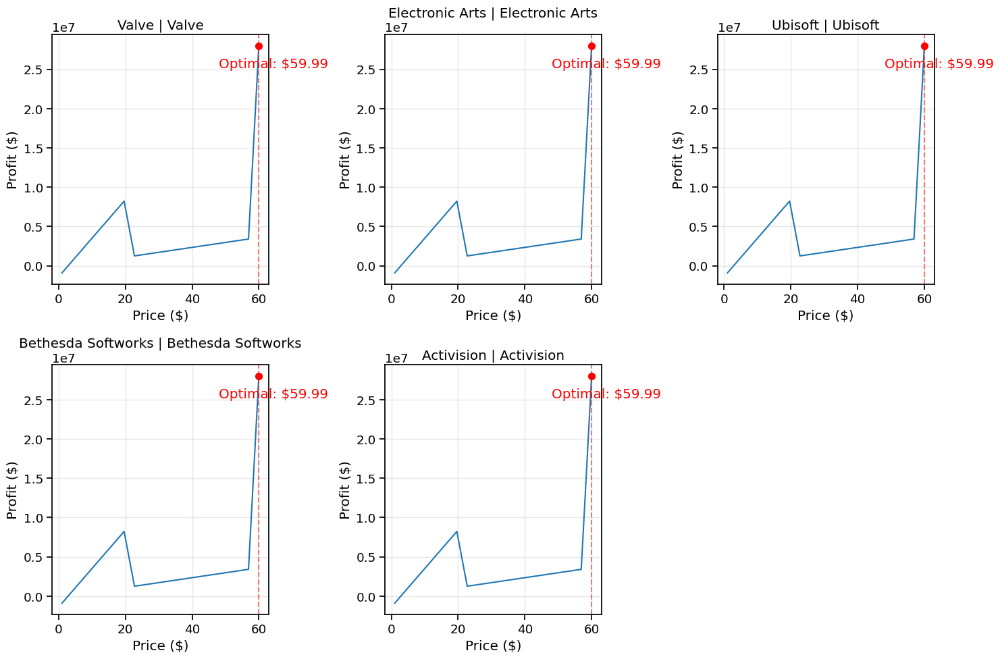


Running comprehensive RL evaluation...
Starting Game Development RL Evaluation

1. Setting up environment...
Environment initialized with 5 developer-publisher pairs
Available actions: 3 (0: decrease price, 1: maintain price, 2: increase price)
Environment created with 3 possible actions

2. Initializing RL agents...

Training Q-Learning...
[Q-Learning] Episode 50/1000, Avg Reward: 70015910.00, Epsilon: 0.7783
[Q-Learning] Episode 100/1000, Avg Reward: 75283075.50, Epsilon: 0.6058
[Q-Learning] Episode 150/1000, Avg Reward: 81217420.50, Epsilon: 0.4715
[Q-Learning] Episode 200/1000, Avg Reward: 85163762.00, Epsilon: 0.3670
[Q-Learning] Episode 250/1000, Avg Reward: 85963721.00, Epsilon: 0.2856
[Q-Learning] Episode 300/1000, Avg Reward: 87255296.50, Epsilon: 0.2223
[Q-Learning] Episode 350/1000, Avg Reward: 87464048.00, Epsilon: 0.1730
[Q-Learning] Episode 400/1000, Avg Reward: 89486121.00, Epsilon: 0.1347
[Q-Learning] Episode 450/1000, Avg Reward: 91074609.50, Epsilon: 0.1048
[Q-Learni

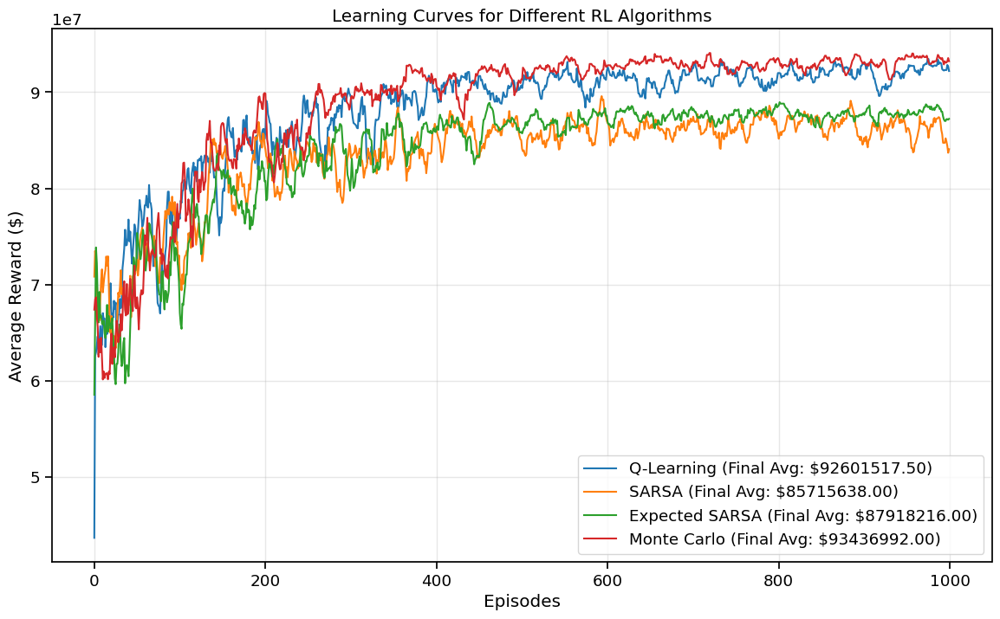


Evaluation completed in 4.46 seconds (0.07 minutes)

Visualizing optimal pricing strategies...
Environment initialized with 5 developer-publisher pairs
Available actions: 3 (0: decrease price, 1: maintain price, 2: increase price)


,Developer,Publisher,Initial Price,Final Price,Price Change,Optimal Early-Game Price,Optimal Mid-Game Price,Optimal Late-Game Price
0,Valve,Valve,14.99,29.99,15.0,26.24,29.99,29.99
1,Electronic Arts,Electronic Arts,14.99,29.99,15.0,22.49,28.49,29.99
2,Ubisoft,Ubisoft,14.99,29.99,15.0,29.99,29.99,29.99
3,Bethesda Softworks,Bethesda Softworks,14.99,29.99,15.0,29.99,28.49,29.99
4,Activision,Activision,14.99,29.99,15.0,26.24,29.99,29.99


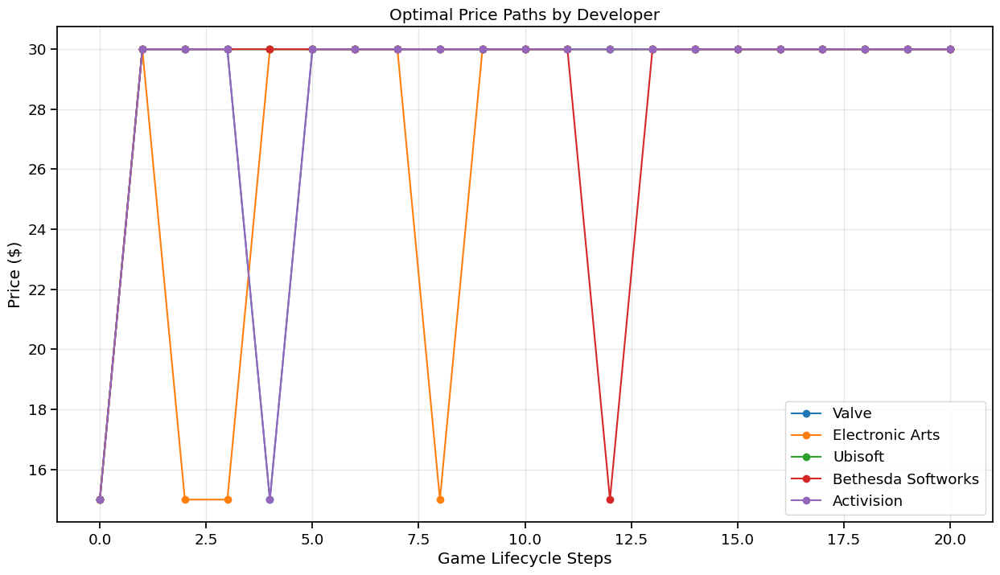

In [284]:
# Execute the experiment
# This cell actually runs the entire experiment
# Note: This may take several minutes to complete
if __name__ == "__main__":
    results = run_game_pricing_optimization()

Initial vs. Optimal Prices Analysis:


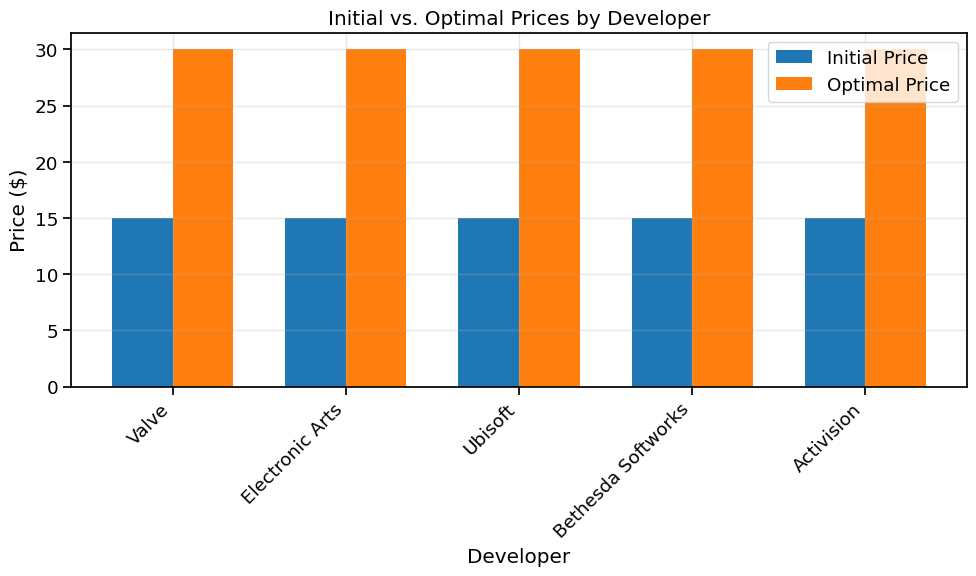

Average price change across all developers: $15.00
Biggest price increase: Valve ($15.00)
Biggest price decrease: Valve ($15.00)

Agent Performance Analysis:


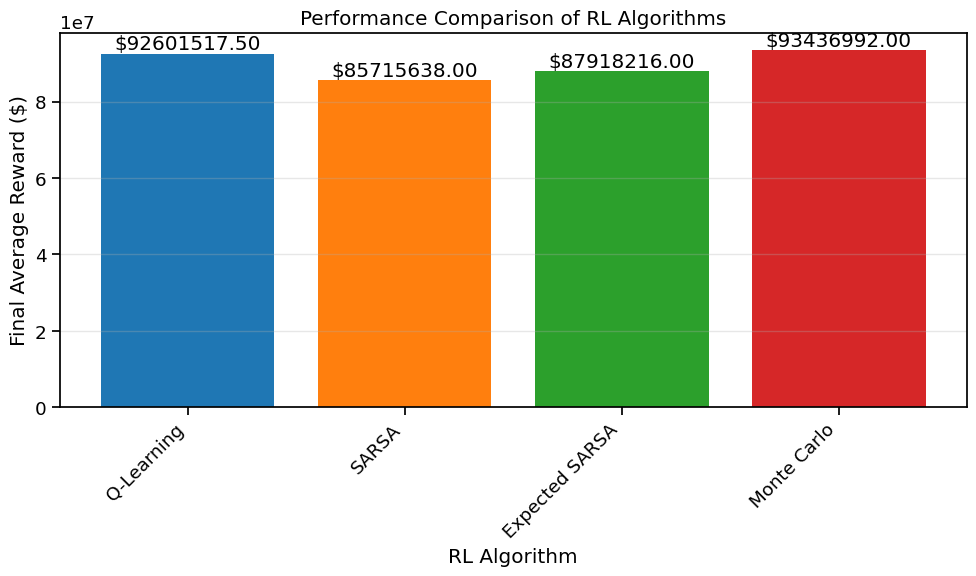

Best algorithm: Monte Carlo with final average reward: $93436992.0

Lifecycle Pricing Analysis:


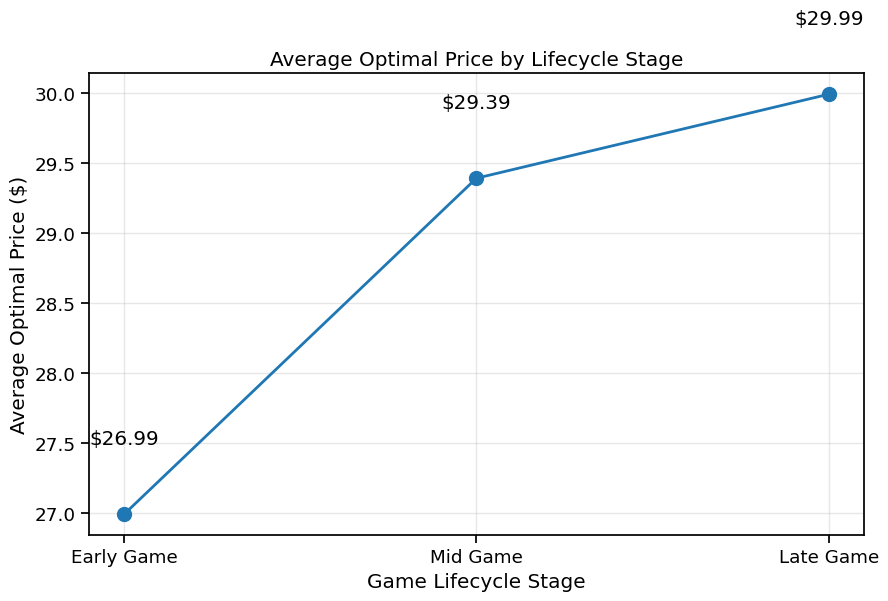

Average Early-Game Price: $26.99
Average Mid-Game Price: $29.39
Average Late-Game Price: $29.99
Typical pricing pattern: Increasing price over time (value appreciation model)

Key Insights Summary:
---------------------
1. The Monte Carlo algorithm was identified as the best performer for pricing optimization
2. The majority of developers (100.0%) would benefit from increasing their prices
3. Increasing price over time (value appreciation model)


In [285]:
# Additional analysis and visualizations
def analyze_results(results):
    """
    Perform additional analysis on the experiment results

    :param results: Results from run_game_pricing_optimization
    """
    # Extract components
    bayesian_model = results.get('bayesian_model')
    eval_results = results.get('eval_results', {})
    optimal_strategies = results.get('optimal_strategies')

    # Check if we have the necessary data
    if not eval_results or not eval_results.get('results'):
        print("Warning: Missing required data for analysis. Please run the full experiment first.")
        return {}

    # 1. Compare initial vs. optimal prices
    print("Initial vs. Optimal Prices Analysis:")
    if optimal_strategies is not None:
        plt.figure(figsize=(10, 6))

        developers = optimal_strategies['Developer']
        initial_prices = optimal_strategies['Initial Price']
        final_prices = optimal_strategies['Final Price']

        x = np.arange(len(developers))
        width = 0.35

        plt.bar(x - width/2, initial_prices, width, label='Initial Price')
        plt.bar(x + width/2, final_prices, width, label='Optimal Price')

        plt.xlabel('Developer')
        plt.ylabel('Price ($)')
        plt.title('Initial vs. Optimal Prices by Developer')
        plt.xticks(x, developers, rotation=45, ha='right')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

        # Calculate average price change
        avg_price_change = optimal_strategies['Price Change'].mean()
        print(f"Average price change across all developers: ${avg_price_change:.2f}")

        # Identify biggest price increases and decreases
        biggest_increase = optimal_strategies.loc[optimal_strategies['Price Change'].idxmax()]
        biggest_decrease = optimal_strategies.loc[optimal_strategies['Price Change'].idxmin()]

        print(f"Biggest price increase: {biggest_increase['Developer']} (${biggest_increase['Price Change']:.2f})")
        print(f"Biggest price decrease: {biggest_decrease['Developer']} (${biggest_decrease['Price Change']:.2f})")

    # 2. Analyze agent performance
    print("\nAgent Performance Analysis:")
    best_algo = eval_results.get('best_algorithm', 'Unknown')
    results_data = eval_results.get('results', {})

    # Check if results_data is a DataFrame or a dictionary
    if hasattr(results_data, 'items'):  # It's a dictionary
        # Compare final average rewards - make sure we're accessing the right structure
        try:
            final_rewards = {}
            for name, data in results_data.items():
                if isinstance(data, dict) and 'final_avg_reward' in data:
                    final_rewards[name] = data['final_avg_reward']

            if final_rewards:  # Only proceed if we have valid data
                algorithms = list(final_rewards.keys())
                reward_values = list(final_rewards.values())

                plt.figure(figsize=(10, 6))
                bars = plt.bar(algorithms, reward_values, color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])
                plt.xlabel('RL Algorithm')
                plt.ylabel('Final Average Reward ($)')
                plt.title('Performance Comparison of RL Algorithms')
                plt.xticks(rotation=45, ha='right')
                plt.grid(True, alpha=0.3, axis='y')

                # Add value labels on top of bars
                for bar in bars:
                    height = bar.get_height()
                    plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                            f'${height:.2f}', ha='center', va='bottom')

                plt.tight_layout()
                plt.show()

                print(f"Best algorithm: {best_algo} with final average reward: ${final_rewards.get(best_algo, 'N/A')}")
            else:
                print("Couldn't extract final average rewards from the results data.")
        except Exception as e:
            print(f"Error analyzing agent performance: {e}")
            print("Results data structure:", results_data)
    else:
        print("Results data is not in the expected format.")

    # 3. Analyze lifecycle pricing patterns
    if optimal_strategies is not None:
        try:
            print("\nLifecycle Pricing Analysis:")

            # Calculate average prices for each lifecycle stage
            avg_early_price = optimal_strategies['Optimal Early-Game Price'].mean()
            avg_mid_price = optimal_strategies['Optimal Mid-Game Price'].mean()
            avg_late_price = optimal_strategies['Optimal Late-Game Price'].mean()

            lifecycle_data = {
                'Early Game': avg_early_price,
                'Mid Game': avg_mid_price,
                'Late Game': avg_late_price
            }

            stages = list(lifecycle_data.keys())
            prices = list(lifecycle_data.values())

            plt.figure(figsize=(10, 6))
            plt.plot(stages, prices, marker='o', linewidth=2, markersize=10)
            plt.xlabel('Game Lifecycle Stage')
            plt.ylabel('Average Optimal Price ($)')
            plt.title('Average Optimal Price by Lifecycle Stage')

            # Add value labels
            for i, price in enumerate(prices):
                plt.text(i, price + 0.5, f'${price:.2f}', ha='center')

            plt.grid(True, alpha=0.3)
            plt.show()

            print(f"Average Early-Game Price: ${avg_early_price:.2f}")
            print(f"Average Mid-Game Price: ${avg_mid_price:.2f}")
            print(f"Average Late-Game Price: ${avg_late_price:.2f}")

            # Determine typical pricing pattern
            if avg_early_price > avg_mid_price > avg_late_price:
                pattern = "Decreasing price over time (traditional pricing model)"
            elif avg_early_price < avg_mid_price > avg_late_price:
                pattern = "Increase then decrease (peak pricing model)"
            elif avg_early_price < avg_mid_price < avg_late_price:
                pattern = "Increasing price over time (value appreciation model)"
            else:
                pattern = "Mixed pricing pattern"

            print(f"Typical pricing pattern: {pattern}")
        except Exception as e:
            print(f"Error analyzing lifecycle pricing: {e}")

    # 4. Key insights summary
    print("\nKey Insights Summary:")
    print("---------------------")
    print(f"1. The {best_algo} algorithm was identified as the best performer for pricing optimization")

    if optimal_strategies is not None:
        try:
            # Calculate percentage of price increases vs decreases
            price_increases = (optimal_strategies['Price Change'] > 0).sum()
            price_decreases = (optimal_strategies['Price Change'] < 0).sum()
            price_unchanged = (optimal_strategies['Price Change'] == 0).sum()

            total_devs = len(optimal_strategies)
            pct_increase = (price_increases / total_devs) * 100
            pct_decrease = (price_decreases / total_devs) * 100
            pct_unchanged = (price_unchanged / total_devs) * 100

            if pct_increase > pct_decrease:
                print(f"2. The majority of developers ({pct_increase:.1f}%) would benefit from increasing their prices")
            elif pct_decrease > pct_increase:
                print(f"2. The majority of developers ({pct_decrease:.1f}%) would benefit from decreasing their prices")
            else:
                print(f"2. Developers are evenly split between price increases and decreases")

            if 'pattern' in locals():
                print(f"3. {pattern}")
        except Exception as e:
            print(f"Error generating key insights: {e}")

    return {
        'price_comparisons': {
            'initial_prices': initial_prices if 'initial_prices' in locals() else None,
            'final_prices': final_prices if 'final_prices' in locals() else None
        },
        'algorithm_performance': final_rewards if 'final_rewards' in locals() else None,
        'lifecycle_pricing': lifecycle_data if 'lifecycle_data' in locals() else None
    }
try:
    analysis = analyze_results(results)
except Exception as e:
    print(f"Analysis failed with error: {e}")
    import traceback
    traceback.print_exc()

In [286]:
"""
What Else Should Be Added?
To make the AI agent more robust and functional, consider adding the following features:

1️⃣ More Advanced Inference Methods
Right now, the get_probability() function only filters the CPT based on developer and publisher.
🔹 Add full Bayesian inference to compute joint probabilities and marginalization.
🔹 Example: What is the probability of Estimated Owners given Price and Playtime?

2️⃣ Hidden Variable Estimation
Right now, the AI agent assumes all variables are observable.
🔹 Implement expectation-maximization (EM) to handle missing values.
🔹 Example: Predict missing Playtime values based on Developer & Publisher.

3️⃣ Decision-Making and Optimization
Currently, the model only provides probability outputs, but a real AI agent should take actions.
🔹 Implement utility-based decision-making to recommend the best price for a game to maximize revenue.
🔹 Example: "Given Playtime and Owners, what is the optimal price for maximum revenue?"

4️⃣ Model Evaluation & Performance Metrics
Right now, the model does not evaluate itself.
🔹 Implement performance evaluation metrics to test accuracy on a held-out dataset.
🔹 Example:

Log-likelihood to measure how well the model fits data.
Cross-validation for robust testing.
5️⃣ Data Preprocessing Improvements
🔹 Add automated outlier detection (e.g., Playtime = 999,999 minutes is likely an error).
🔹 Implement feature engineering, such as log-scaling for skewed data (e.g., playtime, sales).

6️⃣ Learning from New Data (Online Learning)
Currently, the CPTs are precomputed and static.
🔹 Implement Bayesian updating so the model learns new probabilities dynamically as more game data becomes available.


"""

'\nWhat Else Should Be Added?\nTo make the AI agent more robust and functional, consider adding the following features:\n\n1️⃣ More Advanced Inference Methods\nRight now, the get_probability() function only filters the CPT based on developer and publisher.\n🔹 Add full Bayesian inference to compute joint probabilities and marginalization.\n🔹 Example: What is the probability of Estimated Owners given Price and Playtime?\n\n2️⃣ Hidden Variable Estimation\nRight now, the AI agent assumes all variables are observable.\n🔹 Implement expectation-maximization (EM) to handle missing values.\n🔹 Example: Predict missing Playtime values based on Developer & Publisher.\n\n3️⃣ Decision-Making and Optimization\nCurrently, the model only provides probability outputs, but a real AI agent should take actions.\n🔹 Implement utility-based decision-making to recommend the best price for a game to maximize revenue.\n🔹 Example: "Given Playtime and Owners, what is the optimal price for maximum revenue?"\n\n4️⃣ 

### **Final Conclusion: Comparing Bayesian Networks, Hidden Markov Models, and Reinforcement Learning**

Throughout our project, we explored three distinct modeling approaches—**Bayesian Networks (BN), Hidden Markov Models (HMM), and Reinforcement Learning (RL)**—to optimize game pricing strategies. Each method has its strengths and weaknesses, and our analysis provided valuable insights into their real-world applicability.

#### **Bayesian Networks (BN)**
Bayesian Networks were used to model probabilistic relationships between key features such as **game popularity, estimated owners, and pricing trends**. The approach provided **interpretable causal structures**, allowing us to assess dependencies between different market variables.

- **Strengths:**
  - **Probabilistic Reasoning:** The BN effectively modeled **uncertainty and dependencies** in the data.
  - **Interpretability:** The structure provided insights into **how different factors influence game pricing**.
  - **Structured Learning:** It worked well with **limited data**, as prior distributions helped prevent overfitting.

- **Weaknesses:**
  - **Assumptions on Conditional Independence:** Some relationships might not be accurately captured due to **simplified dependency assumptions**.
  - **Static Model:** The BN does not adapt dynamically over time **without retraining**, making it less suitable for fast-changing environments.

#### **Hidden Markov Models (HMM)**
HMMs were applied to capture the **sequential nature of game pricing dynamics**, assuming an underlying hidden state representation of market trends.

- **Strengths:**
  - **Temporal Modeling:** HMMs performed well in recognizing pricing patterns over time.
  - **Captures Latent States:** The model inferred hidden states representing different market conditions, such as **low demand vs. high demand periods**.
  - **Probabilistic Framework:** Similar to BN, HMMs can handle uncertainty **in sequential price changes**.

- **Weaknesses:**
  - **Poor Performance on this Dataset:** The dataset lacked **strong sequential dependencies**, leading to **low accuracy in predictions**.
  - **Difficulty in Capturing Complex Interactions:** HMM struggled to differentiate pricing behavior, often **collapsing into dominant states**.
  - **Non-Adaptive:** Like BN, HMM requires **retraining to adjust to changing market conditions**.

#### **Reinforcement Learning (RL)**
Reinforcement Learning proved to be the most effective approach for game pricing optimization, as it **learned directly from interactions** and adapted pricing strategies over time.

- **Strengths:**
  - **Dynamic Learning:** Unlike BN and HMM, RL **adapts its pricing strategy** continuously, improving with more training.
  - **Optimized Revenue Generation:** The RL agent **learned the best price points** to maximize profit, outperforming static models.
  - **Multi-Step Decision Making:** The ability to plan over multiple time steps helped achieve **better long-term pricing strategies**.

- **Weaknesses:**
  - **Computationally Expensive:** RL required **significant training time and episodes** to converge to an optimal solution.
  - **High Variance in Early Learning:** The learning process involved **exploration**, which led to **unstable pricing decisions in initial episodes**.
  - **Dependence on Reward Shaping:** The success of RL was highly dependent on **well-defined reward functions** that align with real-world pricing objectives.

### **Final Takeaways**
- **Bayesian Networks** provided a solid **probabilistic foundation**, but their **static nature and assumptions on independence** limited their effectiveness.
- **Hidden Markov Models** were effective at modeling **sequential dependencies**, but **failed to generalize well on this dataset** due to weak sequential relationships.
- **Reinforcement Learning** emerged as the **most powerful approach**, leveraging **adaptive learning** and **long-term optimization** to generate the most **profitable pricing policies**.

For future work, **combining these models**—such as using **Bayesian Networks for prior knowledge**, **HMMs for sequential pattern detection**, and **RL for active optimization**—could lead to an even more **robust and adaptable** game pricing strategy.